# Import Libraries

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, log_loss, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier

# Load & Explore Dataset

Dataset:
Dua,D. and Graff,C.(2019). UCI MAchine Learning Repository [https://archive.ics.uci.edu/dataset/159/magic+gamma+telescope]. Irvine, CA: University of California School of Information adn Computer Science.

Dataset Generated by : D. Heck et al., CORSIKA, A Monte Carlo code to simulate extensive air showers, Forschungszentrum Karlsruhe FZKA 6019 (1998).

In [2]:
cols = ["fLength", "fWidth", "fSize", "fConc", "fConc1", "fAsym", "fM3Long", "fM3Trans", "fAlpha", "fDist", "class"]
tm_data = pd.read_csv(r"C:\Users\cereb\OneDrive\Documents\Rishabh\Projects\New folder (2)\magic+gamma+telescope\magic04.data", names=cols)
tm_data["class"] = (tm_data["class"] == "g").astype(int)
tm_data

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,1
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,1
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,1
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,1
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,1
...,...,...,...,...,...,...,...,...,...,...,...
19015,21.3846,10.9170,2.6161,0.5857,0.3934,15.2618,11.5245,2.8766,2.4229,106.8258,0
19016,28.9452,6.7020,2.2672,0.5351,0.2784,37.0816,13.1853,-2.9632,86.7975,247.4560,0
19017,75.4455,47.5305,3.4483,0.1417,0.0549,-9.3561,41.0562,-9.4662,30.2987,256.5166,0
19018,120.5135,76.9018,3.9939,0.0944,0.0683,5.8043,-93.5224,-63.8389,84.6874,408.3166,0


In [3]:
tm_data.isnull().sum()

fLength     0
fWidth      0
fSize       0
fConc       0
fConc1      0
fAsym       0
fM3Long     0
fM3Trans    0
fAlpha      0
fDist       0
class       0
dtype: int64

In [4]:
tm_data.describe()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
count,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000,19020.000000
mean,53.250154,22.180966,2.825017,0.380327,0.214657,-4.331745,10.545545,0.249726,27.645707,193.818026,0.648370
std,42.364855,18.346056,0.472599,0.182813,0.110511,59.206062,51.000118,20.827439,26.103621,74.731787,0.477492
min,4.283500,0.000000,1.941300,0.013100,0.000300,-457.916100,-331.780000,-205.894700,0.000000,1.282600,0.000000
25%,24.336000,11.863800,2.477100,0.235800,0.128475,-20.586550,-12.842775,-10.849375,5.547925,142.492250,0.000000
50%,37.147700,17.139900,2.739600,0.354150,0.196500,4.013050,15.314100,0.666200,17.679500,191.851450,1.000000
75%,70.122175,24.739475,3.101600,0.503700,0.285225,24.063700,35.837800,10.946425,45.883550,240.563825,1.000000
max,334.177000,256.382000,5.323300,0.893000,0.675200,575.240700,238.321000,179.851000,90.000000,495.561000,1.000000


# Data Cleaning

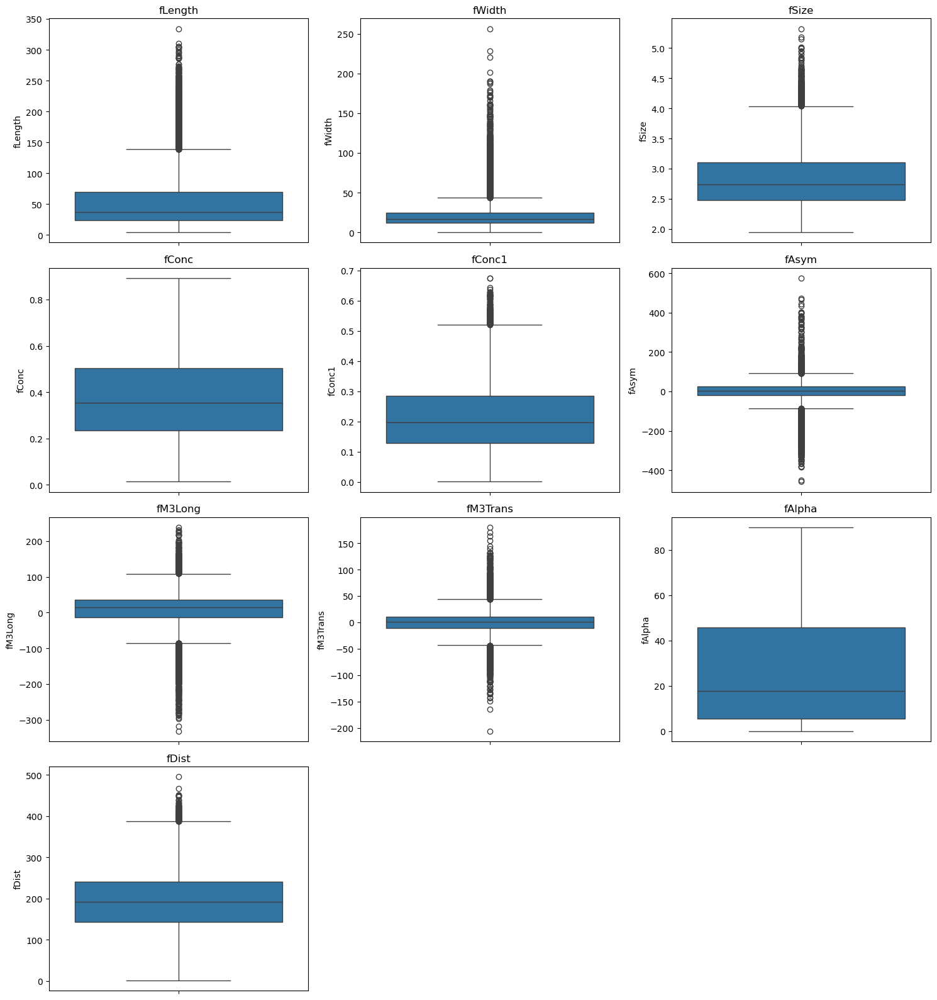

In [5]:
features = cols[:-1]
n_features = len(tm_data.columns[:-1])
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

# Create figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False)

# Flatten axes array for easier iteration
axes = axes.flatten()

# Plot histograms for each feature
for i, label in enumerate(features):
    sns.boxplot(data=tm_data, y=label, ax=axes[i])
    axes[i].set_title(f'Box Plot of {label} by {tm_data["class"]}')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_title(label)
    
# Hide empty subplots if any
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)
    

plt.tight_layout()
plt.show()

In [6]:
# Identify and remove outliers
count =  n_cols
initial_data_length = len(tm_data)
while True:
    data_length_before = len(tm_data)
    for col in features:
        Q1 = tm_data[col].quantile(0.25)
        Q3 = tm_data[col].quantile(0.75)
        IQR = Q3 - Q1
        
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        tm_data = tm_data[(tm_data[col] >= lower_bound) & (tm_data[col] <= upper_bound)]
    data_length_after = len(tm_data)
    if data_length_before == data_length_after:
        break  # No more outliers removed

print(f"Initial data length: {initial_data_length}")
print(f"Final data length after outlier removal: {data_length_after}")

# Check for remaining outliers in each column
print("\n Checking for remaining outliers:")
for col in features:
    Q1 = tm_data[col].quantile(0.25)
    Q3 = tm_data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_count = tm_data[(tm_data[col] < lower_bound) | (tm_data[col] > upper_bound)].shape[0]
    print(f"\nColumn '{col}': {outliers_count} outliers remaining")

Initial data length: 19020
Final data length after outlier removal: 12004

 Checking for remaining outliers:

Column 'fLength': 0 outliers remaining

Column 'fWidth': 0 outliers remaining

Column 'fSize': 0 outliers remaining

Column 'fConc': 0 outliers remaining

Column 'fConc1': 0 outliers remaining

Column 'fAsym': 0 outliers remaining

Column 'fM3Long': 0 outliers remaining

Column 'fM3Trans': 0 outliers remaining

Column 'fAlpha': 0 outliers remaining

Column 'fDist': 0 outliers remaining


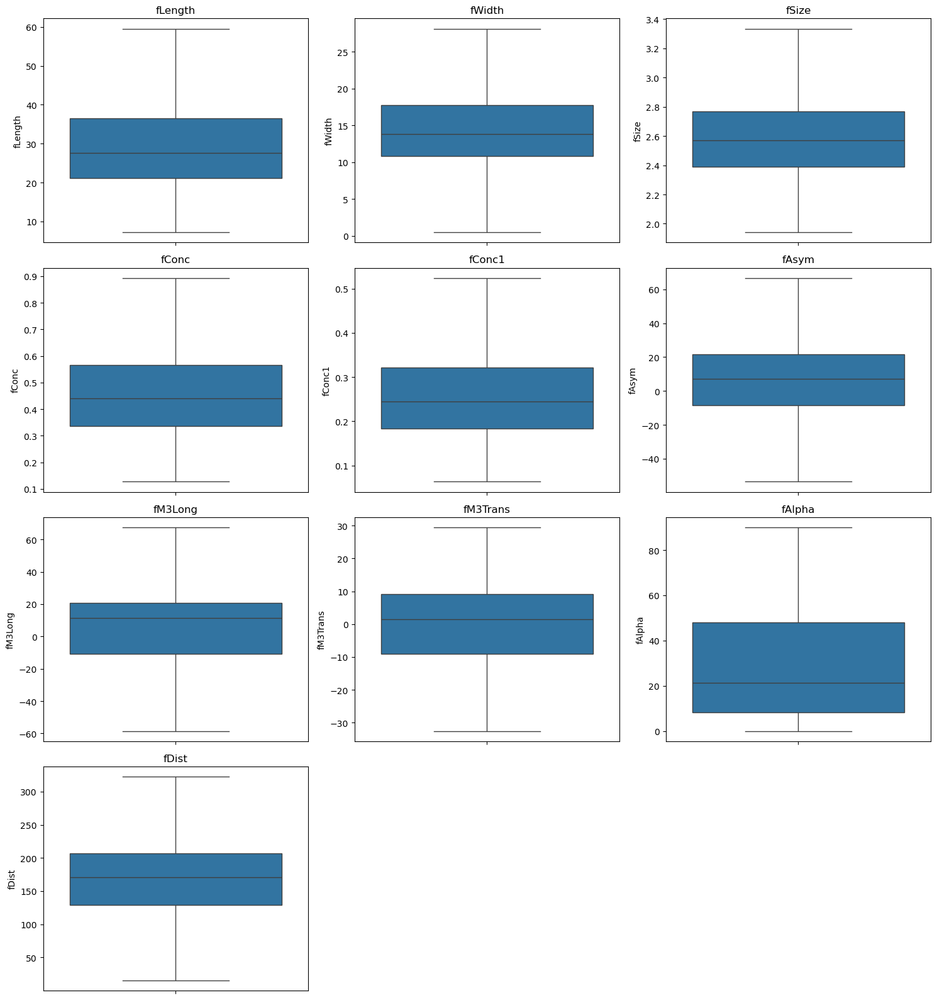

In [7]:
features = cols[:-1]
n_features = len(tm_data.columns[:-1])
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

# Create figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False)

# Flatten axes array for easier iteration
axes = axes.flatten()

# Plot histograms for each feature
for i, label in enumerate(features):
    sns.boxplot(data=tm_data, y=label, ax=axes[i])
    axes[i].set_title(f'Box Plot of {label} by {tm_data["class"]}')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_title(label)
    
# Hide empty subplots if any
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

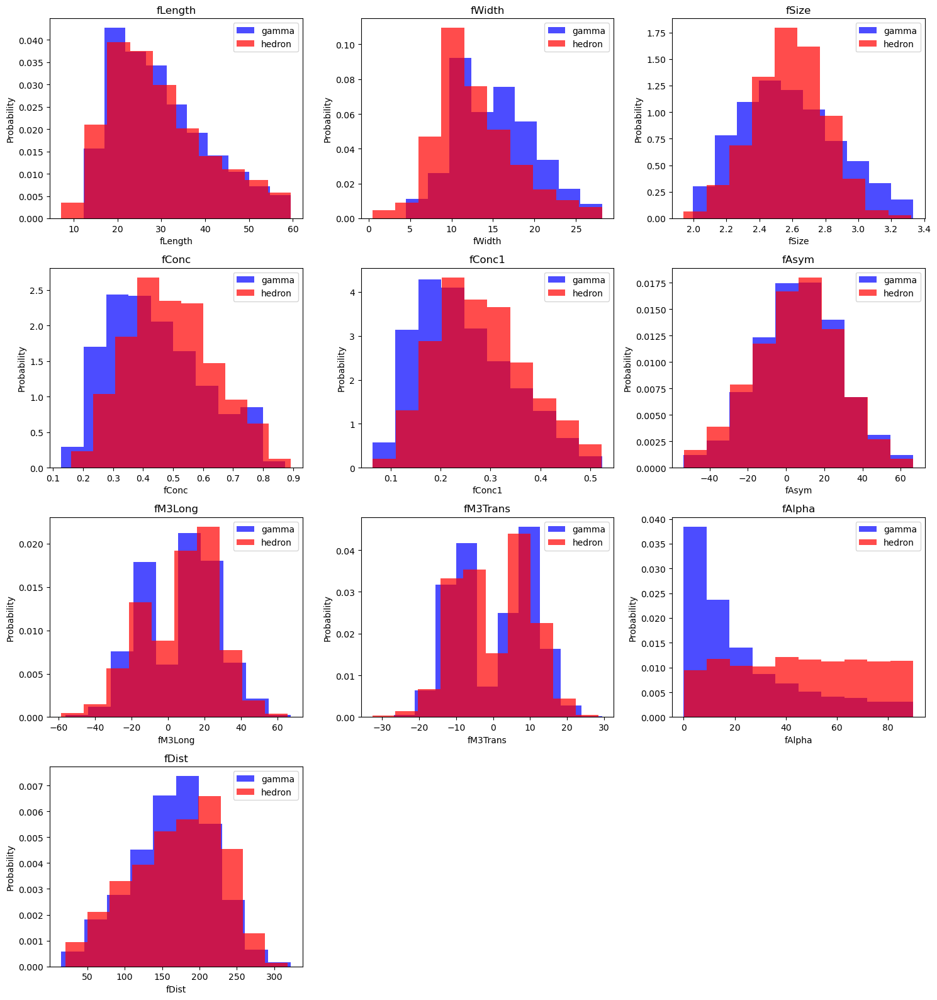

In [8]:
features = cols[:-1]
n_features = len(tm_data.columns[:-1])
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

# Create figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False)

# Flatten axes array for easier iteration
axes = axes.flatten()

# Plot histograms for each feature
for i, label in enumerate(features):
    axes[i].hist(tm_data[tm_data["class"] == 1][label], color="blue", label="gamma", alpha=0.7, density=True)
    axes[i].hist(tm_data[tm_data["class"] == 0][label], color="red", label="hedron", alpha=0.7, density=True)
    axes[i].set_title(label)
    axes[i].set_xlabel(label)
    axes[i].set_ylabel("Probability")
    axes[i].legend()

# Hide empty subplots if any
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# Spliting Data

In [9]:
# Training and Testing Dataset
train, valid, test = np.split(tm_data.sample(frac=1),[int(0.6*len(tm_data)), int(0.8*len(tm_data))])

def scale_dataset(df, oversample = False):
    x = df[df.columns[:-1]].values
    y = df[df.columns[-1]].values

    scaler = StandardScaler()
    x = scaler.fit_transform(x)

    if oversample:
        ros = RandomOverSampler()
        x,y = ros.fit_resample(x,y)

    data = np.hstack((x,np.reshape(y, (-1,1))))

    return data, x,y

train_data, x_train, y_train = scale_dataset(train, oversample = True)
valid_data, x_valid, y_valid = scale_dataset(valid, oversample = False)
test_data, x_test, y_test = scale_dataset(test, oversample = False)

C:\Users\cereb\anaconda3\envs\bis\Lib\site-packages\numpy\_core\fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


# Training Models 

In [41]:
# Initial Model Training

models = {
    'KNN': KNeighborsClassifier(n_neighbors = 5),
    'Logistic Regression': LogisticRegression(),
    'Naive Bayes': GaussianNB(),
    'SVM': SVC(probability=True),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_estimators = 100, random_state=42),
    'Gradient Boost': GradientBoostingClassifier(n_estimators = 100, random_state=42),
    'ADA Boost': AdaBoostClassifier(n_estimators = 100, random_state=42),
}

result = []

for name, model in models.items():
    model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)

    # Identify if the data is Overfitting, underfitting or it is a balance fit
    
    y_train_pred = model.predict(x_train)
    train_accuracy_manual = accuracy_score(y_train, y_train_pred)

    y_pred_val = model.predict(x_valid)
    val_accuracy = accuracy_score(y_valid, y_pred_val)

    # Determine if overfitting, underfitting, or balanced
    if train_accuracy_manual > val_accuracy + 0.1:  # Threshold for overfitting
        fit_status = 'Overfitting'
        # Define parameter grid for GridSearchCV for overfitting models
        if name == 'KNN':
            param_grid = {'n_neighbors': [3, 5, 7, 9]}
        elif name == 'SVM':
            param_grid = {'C': [0.1, 1, 10], 'gamma': [1, 0.1, 0.01]}
        elif name == 'Decision Tree':
            param_grid = {'max_depth': [None, 10, 20, 30], 'min_samples_split': [2, 5, 10]}
        elif name == 'Random Forest':
            param_grid = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20]}
        elif name == 'Gradient Boost':
            param_grid = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.5]}
        elif name == 'ADA Boost':
            param_grid = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 0.5]}
        else:
            param_grid = {} # No specific grid for other models

        if param_grid:
            grid_search = GridSearchCV(model, param_grid, cv=StratifiedKFold(n_splits=5))
            grid_search.fit(x_train, y_train)
            best_params = grid_search.best_params_
            best_score = grid_search.best_score_
        else:
            best_params = "N/A"
            best_score = "N/A"


    elif val_accuracy > train_accuracy_manual + 0.1: # Threshold for underfitting (less common)
        fit_status = 'Underfitting'
        best_params = "N/A"
        best_score = "N/A"
    else:
        fit_status = 'Balanced'
        best_params = "N/A"
        best_score = "N/A"


    # Store results
    result.append({
        'Model': name,
        'Accuracy': accuracy,
        'Training Accuracy': train_accuracy_manual,
        'Validation Accuracy': val_accuracy,
        'Fit Status': fit_status,
        'Best Parameters (GridSearchCV)': best_params,
        'Best Cross-Validation Score': best_score
    })


# Create DataFrame and display results
result_df = pd.DataFrame(result)
print("Initial Model Comparision Report (Training Data)")
result_df

Initial Model Comparision Report (Training Data)


,Model,Accuracy,Training Accuracy,Validation Accuracy,Fit Status,Best Parameters (GridSearchCV),Best Cross-Validation Score
0,KNN,0.768846,0.889596,0.768846,Overfitting,{'n_neighbors': 3},0.834838
1,Logistic Regression,0.755935,0.755094,0.767180,Balanced,N/A,N/A
2,Naive Bayes,0.688880,0.699647,0.705123,Balanced,N/A,N/A
3,SVM,0.833403,0.836305,0.827155,Balanced,N/A,N/A
4,Decision Tree,0.780092,1.000000,0.790504,Overfitting,"{'max_depth': None, 'min_samples_split': 2}",0.903803
5,Random Forest,0.854227,1.000000,0.843815,Overfitting,"{'max_depth': None, 'n_estimators': 200}",0.939657
6,Gradient Boost,0.830904,0.846101,0.820075,Balanced,N/A,N/A
7,ADA Boost,0.740525,0.760678,0.739692,Balanced,N/A,N/A


## Testing Models

### K-Fold Function

In [11]:
def evaluate_model(classifier, x_train, y_train, x_test, y_test, k_folds=5):
    
    # K-Fold Cross Validation on training data
    cv_scores = cross_val_score(classifier, x_train, y_train, cv=k_folds)
    print(f"Cross Validation (K={k_folds}) on Training Data: {cv_scores}")
    print(f"Mean Accuracy: {cv_scores.mean():.2f}")
    print(f"Standard Deviation: {cv_scores.std():.2f}\n")
    
    classifier.fit(x_train, y_train)
    y_pred = classifier.predict(x_test)
    test_accuracy = accuracy_score(y_test, y_pred)
    print(f"Model Accuracy on Test Data: {test_accuracy:.2f}")
    
    return classifier, cv_scores, test_accuracy

### KNN

In [12]:
knn_model = KNeighborsClassifier(n_neighbors = 3)
knn_model.fit(x_train,y_train)
knn_y_pred = knn_model.predict(x_test)
print(classification_report(y_test, knn_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = knn_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.59      0.62      0.61       698
           1       0.84      0.83      0.83      1703

    accuracy                           0.77      2401
   macro avg       0.72      0.72      0.72      2401
weighted avg       0.77      0.77      0.77      2401

Cross Validation (K=3) on Training Data: [0.81633852 0.80899207 0.83627278]
Mean Accuracy: 0.82
Standard Deviation: 0.01

Model Accuracy on Test Data: 0.77


### Logistic Regression

In [13]:
lg_model = LogisticRegression()
lg_model = lg_model.fit(x_train, y_train)
lg_y_pred = lg_model.predict(x_test)
print(classification_report(y_test, lg_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = lg_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.56      0.71      0.63       698
           1       0.87      0.78      0.82      1703

    accuracy                           0.76      2401
   macro avg       0.72      0.74      0.72      2401
weighted avg       0.78      0.76      0.76      2401

Cross Validation (K=3) on Training Data: [0.75639142 0.75022039 0.75485009]
Mean Accuracy: 0.75
Standard Deviation: 0.00

Model Accuracy on Test Data: 0.76


### Naive Bayes

In [14]:
nb_model = GaussianNB()
nb_model = nb_model.fit(x_train, y_train)
nb_y_pred = nb_model.predict(x_test)
print(classification_report(y_test, nb_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = nb_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.48      0.72      0.57       698
           1       0.85      0.68      0.76      1703

    accuracy                           0.69      2401
   macro avg       0.67      0.70      0.66      2401
weighted avg       0.74      0.69      0.70      2401

Cross Validation (K=3) on Training Data: [0.69291801 0.69908904 0.70223398]
Mean Accuracy: 0.70
Standard Deviation: 0.00

Model Accuracy on Test Data: 0.69


### Support Vector Machine (SVM)

In [15]:
svm_model = SVC()
svm_model = svm_model.fit(x_train, y_train)
svm_y_pred = svm_model.predict(x_test)
print(classification_report(y_test, svm_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = svm_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.70      0.74      0.72       698
           1       0.89      0.87      0.88      1703

    accuracy                           0.83      2401
   macro avg       0.80      0.81      0.80      2401
weighted avg       0.84      0.83      0.83      2401

Cross Validation (K=3) on Training Data: [0.81604467 0.82339113 0.81775426]
Mean Accuracy: 0.82
Standard Deviation: 0.00

Model Accuracy on Test Data: 0.83


### Decision Tree 

In [16]:
dt_model = DecisionTreeClassifier()
dt_model = dt_model.fit(x_train, y_train)
dt_y_pred = dt_model.predict(x_test)
print(classification_report(y_test, dt_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = dt_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.65      0.62      0.63       698
           1       0.85      0.86      0.85      1703

    accuracy                           0.79      2401
   macro avg       0.75      0.74      0.74      2401
weighted avg       0.79      0.79      0.79      2401

Cross Validation (K=3) on Training Data: [0.87569791 0.88010579 0.90740741]
Mean Accuracy: 0.89
Standard Deviation: 0.01

Model Accuracy on Test Data: 0.79


### Random Forest

In [17]:
rm_model = RandomForestClassifier(n_estimators = 100, random_state=42)
rm_model = rm_model.fit(x_train, y_train)
rm_y_pred = rm_model.predict(x_test)
print(classification_report(y_test, rm_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = rm_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.79      0.68      0.73       698
           1       0.88      0.93      0.90      1703

    accuracy                           0.85      2401
   macro avg       0.83      0.80      0.82      2401
weighted avg       0.85      0.85      0.85      2401

Cross Validation (K=3) on Training Data: [0.9209521  0.92682927 0.94356261]
Mean Accuracy: 0.93
Standard Deviation: 0.01

Model Accuracy on Test Data: 0.85


### Gradiant Boost 

In [18]:
gb_model = GradientBoostingClassifier(n_estimators = 100, random_state=42)
gb_model = gb_model.fit(x_train, y_train)
gb_y_pred = gb_model.predict(x_test)
print(classification_report(y_test, gb_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = gb_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.69      0.76      0.72       698
           1       0.90      0.86      0.88      1703

    accuracy                           0.83      2401
   macro avg       0.79      0.81      0.80      2401
weighted avg       0.84      0.83      0.83      2401

Cross Validation (K=3) on Training Data: [0.81898325 0.83455774 0.82745444]
Mean Accuracy: 0.83
Standard Deviation: 0.01

Model Accuracy on Test Data: 0.83


### ADA Boost

In [19]:
ada_model = AdaBoostClassifier(n_estimators = 100, random_state=42)
ada_model = ada_model.fit(x_train, y_train)
ada_y_pred = ada_model.predict(x_test)
print(classification_report(y_test, ada_y_pred))

# Evaluate the K-Fold Cross Validation & Grid Search Function

best_model, cv_scores, test_accuracy = evaluate_model(
    classifier = ada_model,
    x_train = x_train,
    y_train = y_train,
    x_test = x_test,
    y_test = y_test,
    k_folds = 3
)

              precision    recall  f1-score   support

           0       0.54      0.76      0.63       698
           1       0.88      0.73      0.80      1703

    accuracy                           0.74      2401
   macro avg       0.71      0.75      0.72      2401
weighted avg       0.78      0.74      0.75      2401

Cross Validation (K=3) on Training Data: [0.75639142 0.76079929 0.75396825]
Mean Accuracy: 0.76
Standard Deviation: 0.00

Model Accuracy on Test Data: 0.74


### Neural Network

In [20]:
# Model
def train_model(x_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs, valid):
    nn_model = tf.keras.Sequential([
        tf.keras.layers.Dense(num_nodes, activation="relu", input_shape=(10,)),
        tf.keras.layers.Dropout(dropout_prob),
        tf.keras.layers.Dense(num_nodes, activation="relu"),
        tf.keras.layers.Dropout(dropout_prob),
        tf.keras.layers.Dense(1, activation="sigmoid")
    ])
    
    nn_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr), loss="binary_crossentropy",  metrics=["accuracy"])
    
    history = nn_model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=valid, verbose=0)
    
    return nn_model, history

# Visulization
def plot_history(history):
    # Loss & Accuracy (History)
    fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(10,4))
    ax1.plot(history.history['loss'], label='loss')
    ax1.plot(history.history['accuracy'], label='accuracy')
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Binary Crossentropy (Loss) & Accuracy")
    ax1.grid(True)
    ax1.legend()

    #Accuracy(History)
    ax2.plot(history.history['val_loss'], label='val_loss')
    ax2.plot(history.history['val_accuracy'], label='val_accuracy')
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Validation Loss & Accuracy")
    ax2.grid(True)
    ax2.legend()

    plt.show()

16 nodes, dropout 0, learning rate 0.01, batch size 16



C:\Users\cereb\anaconda3\envs\bis\Lib\site-packages\keras\src\layers\core\dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


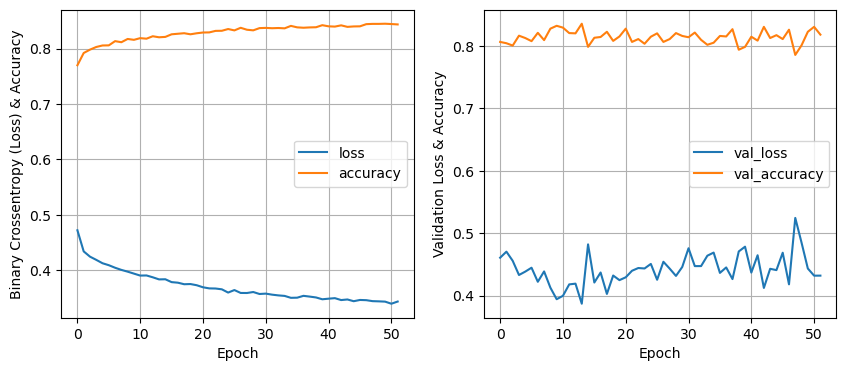

16 nodes, dropout 0, learning rate 0.01, batch size 32



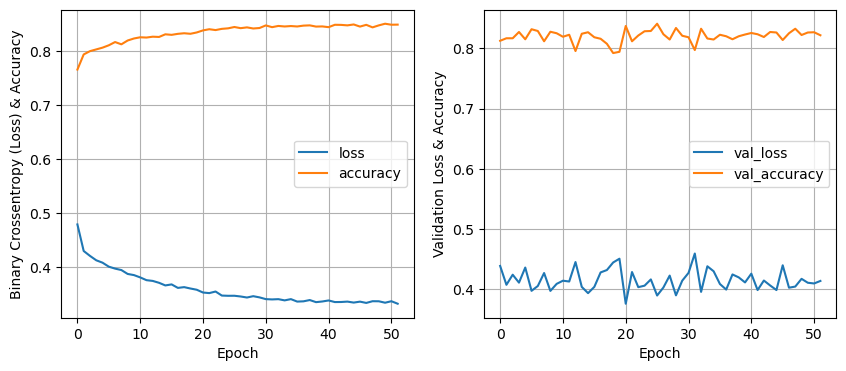

16 nodes, dropout 0, learning rate 0.01, batch size 64



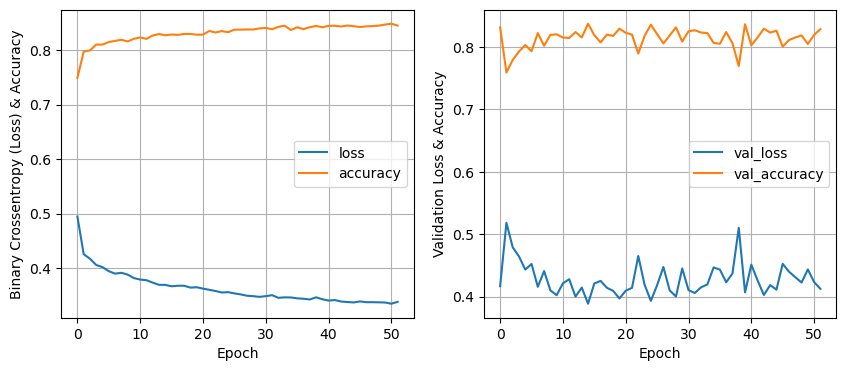

16 nodes, dropout 0, learning rate 0.01, batch size 128



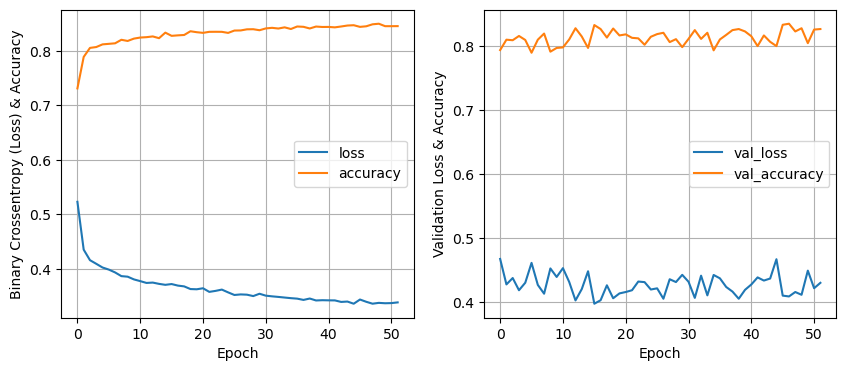

16 nodes, dropout 0, learning rate 0.01, batch size 256



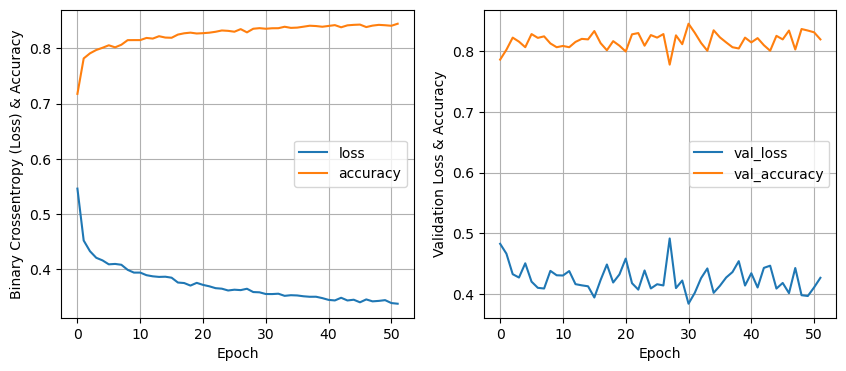

16 nodes, dropout 0, learning rate 0.005, batch size 16



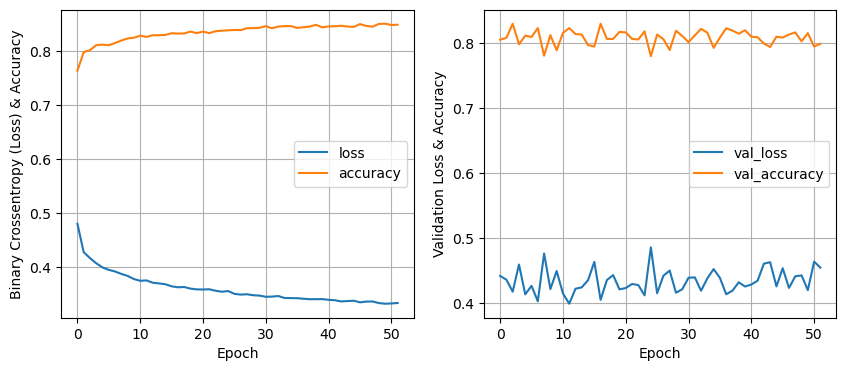

16 nodes, dropout 0, learning rate 0.005, batch size 32



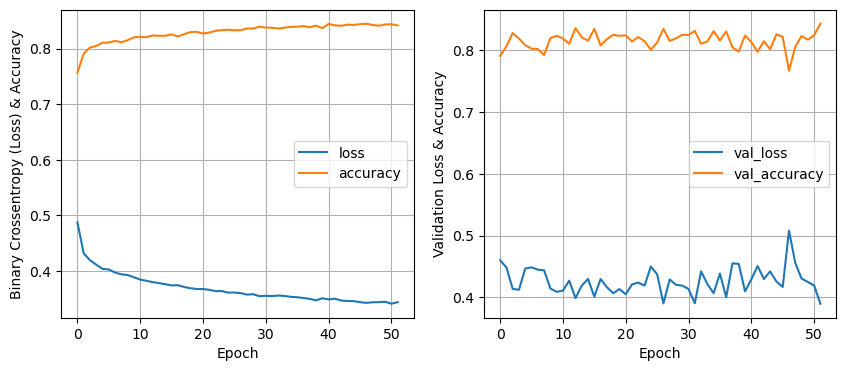

16 nodes, dropout 0, learning rate 0.005, batch size 64



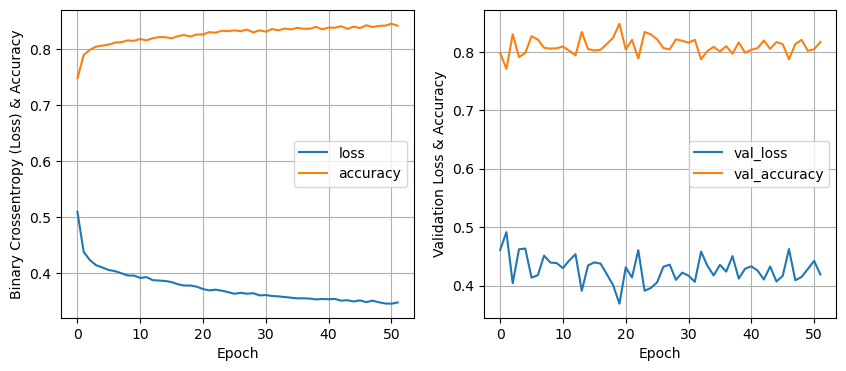

16 nodes, dropout 0, learning rate 0.005, batch size 128



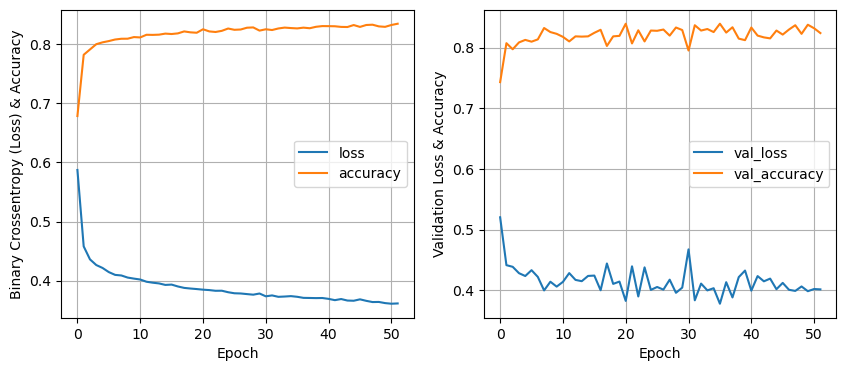

16 nodes, dropout 0, learning rate 0.005, batch size 256



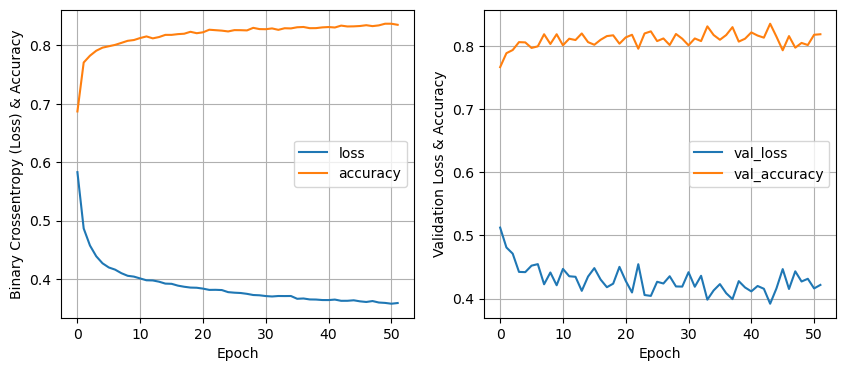

16 nodes, dropout 0, learning rate 0.0001, batch size 16



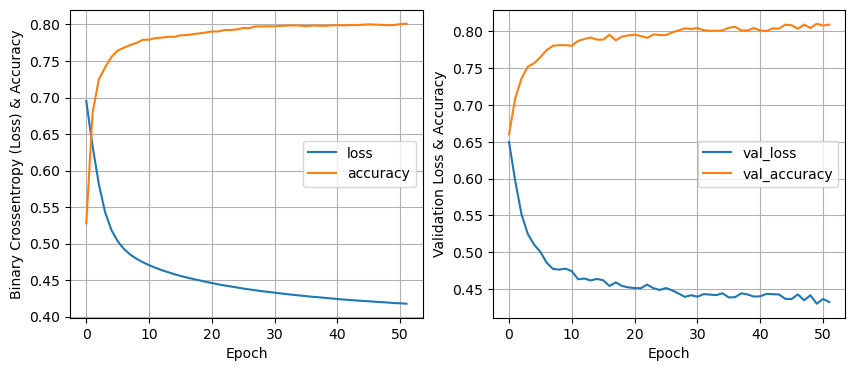

16 nodes, dropout 0, learning rate 0.0001, batch size 32



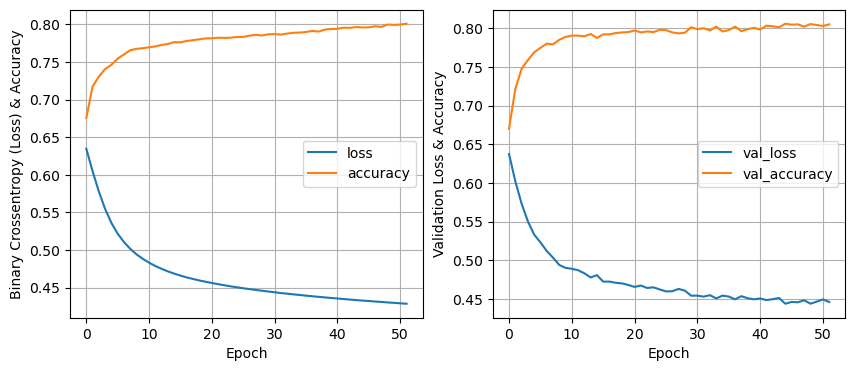

16 nodes, dropout 0, learning rate 0.0001, batch size 64



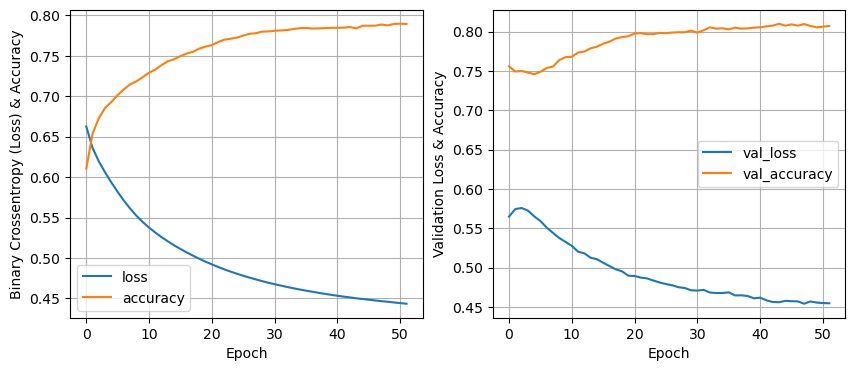

16 nodes, dropout 0, learning rate 0.0001, batch size 128



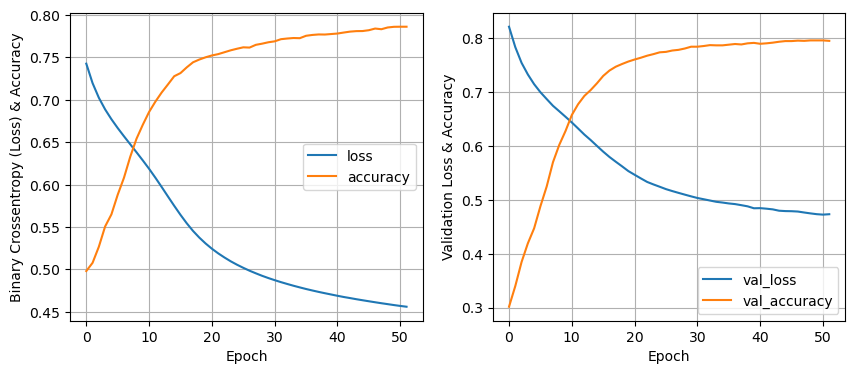

16 nodes, dropout 0, learning rate 0.0001, batch size 256



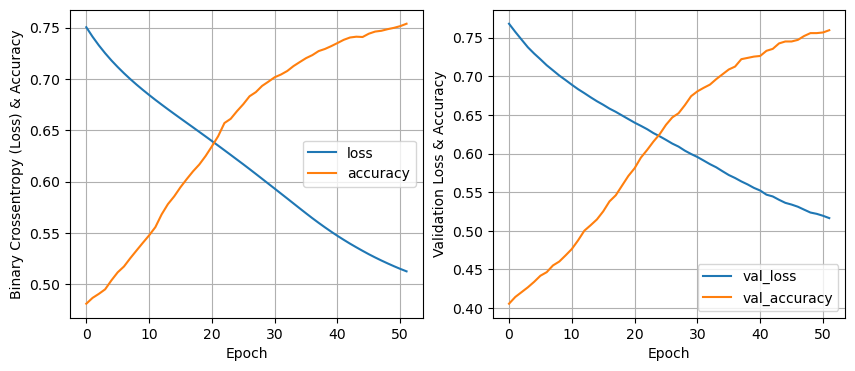

16 nodes, dropout 0.2, learning rate 0.01, batch size 16



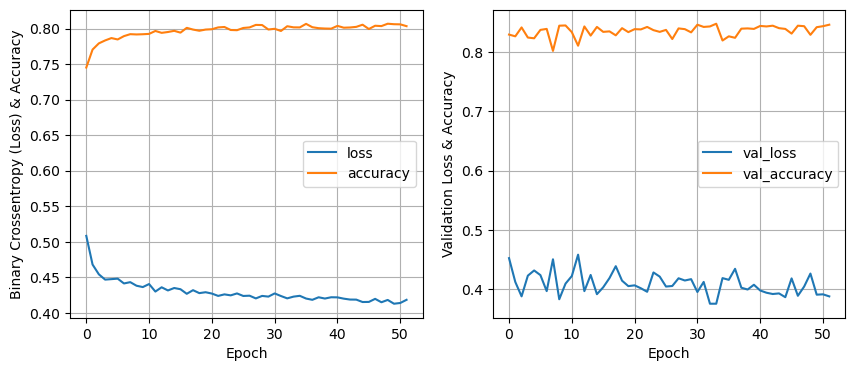

16 nodes, dropout 0.2, learning rate 0.01, batch size 32



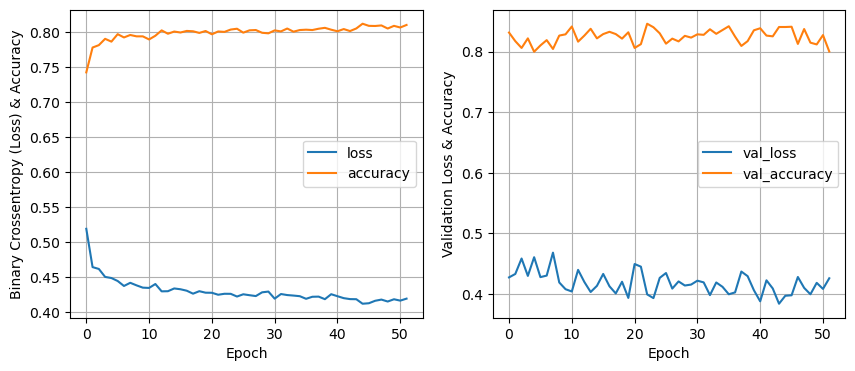

16 nodes, dropout 0.2, learning rate 0.01, batch size 64



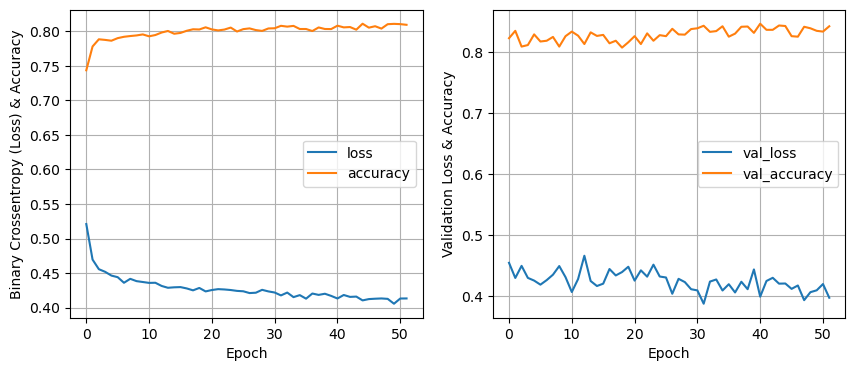

16 nodes, dropout 0.2, learning rate 0.01, batch size 128



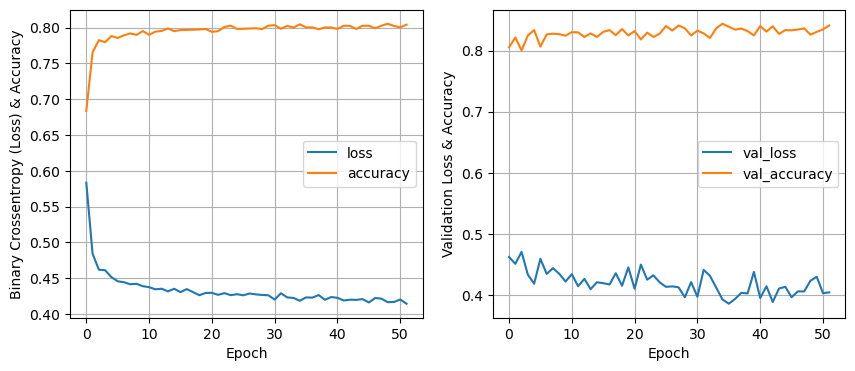

16 nodes, dropout 0.2, learning rate 0.01, batch size 256



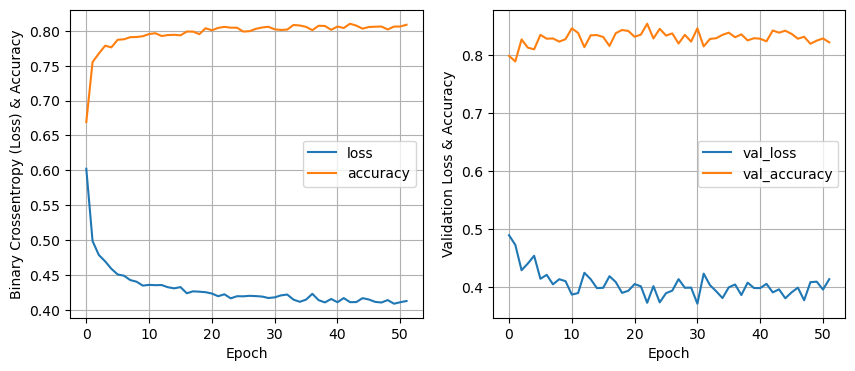

16 nodes, dropout 0.2, learning rate 0.005, batch size 16



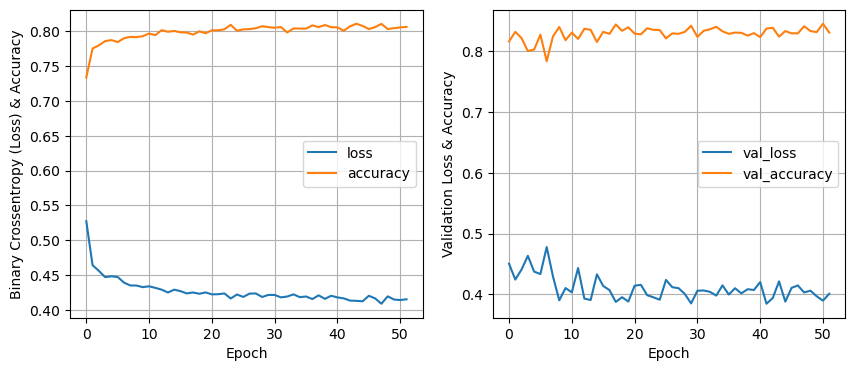

16 nodes, dropout 0.2, learning rate 0.005, batch size 32



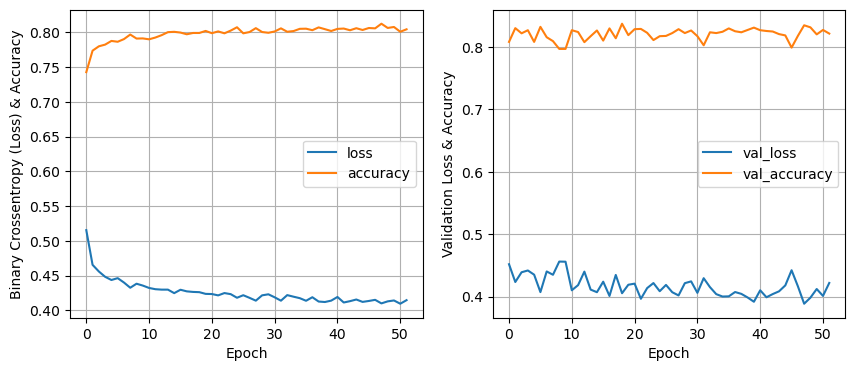

16 nodes, dropout 0.2, learning rate 0.005, batch size 64



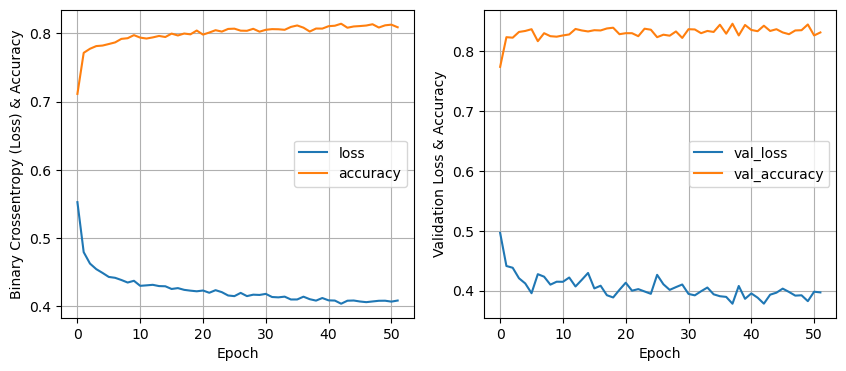

16 nodes, dropout 0.2, learning rate 0.005, batch size 128



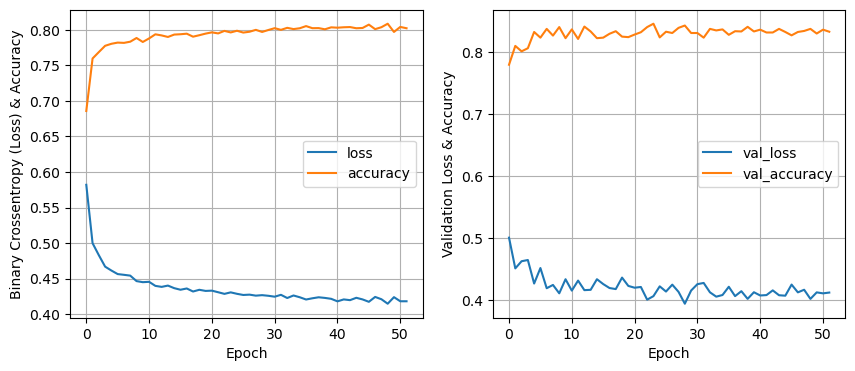

16 nodes, dropout 0.2, learning rate 0.005, batch size 256



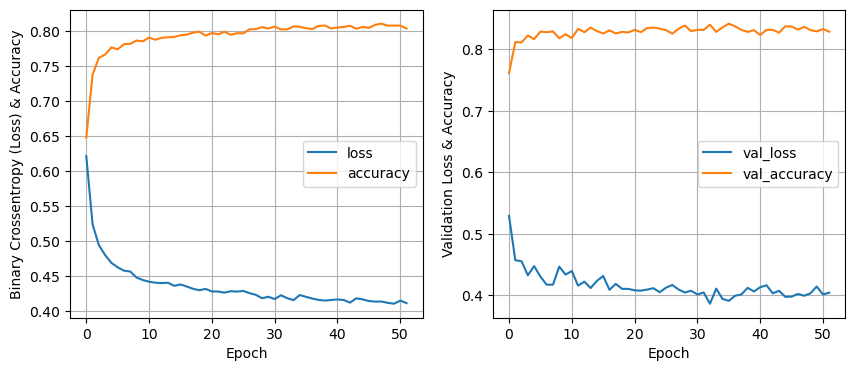

16 nodes, dropout 0.2, learning rate 0.0001, batch size 16



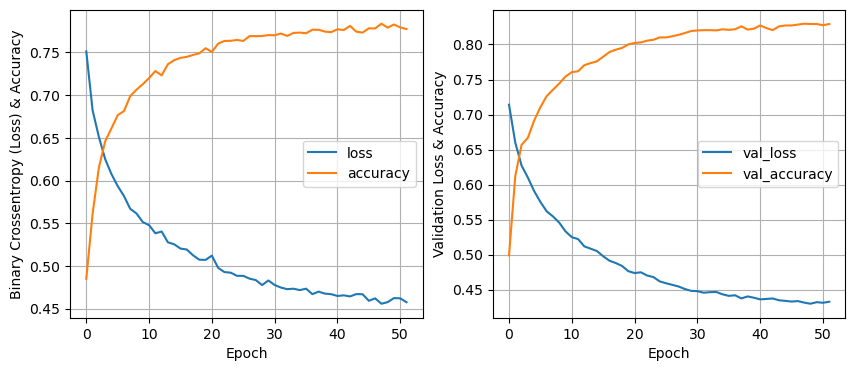

16 nodes, dropout 0.2, learning rate 0.0001, batch size 32



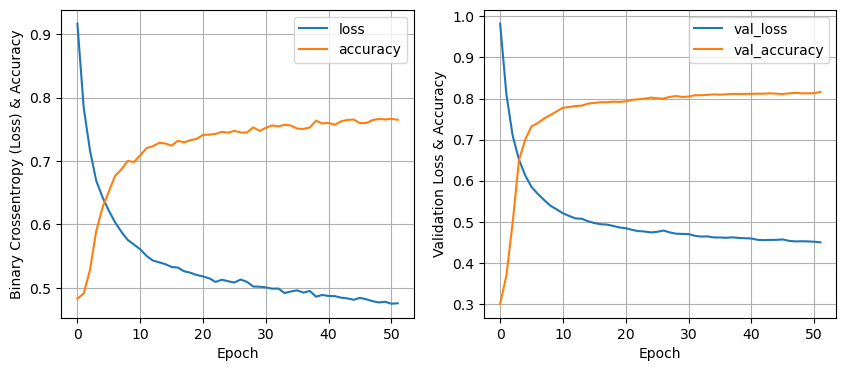

16 nodes, dropout 0.2, learning rate 0.0001, batch size 64



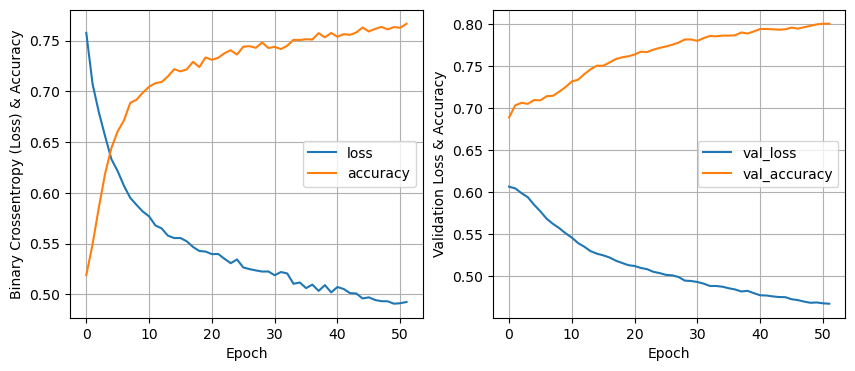

16 nodes, dropout 0.2, learning rate 0.0001, batch size 128



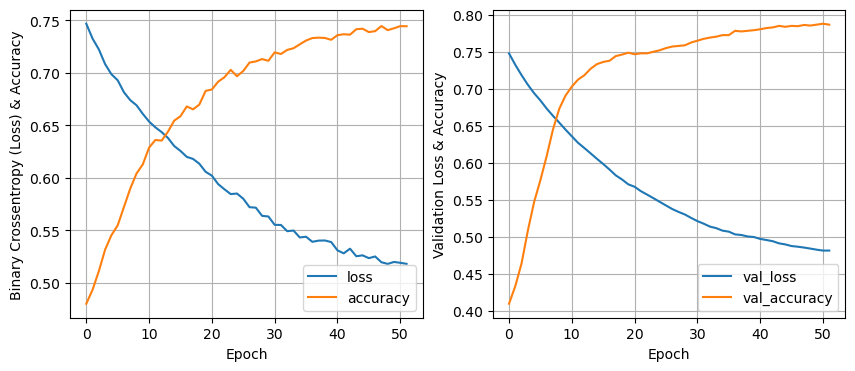

16 nodes, dropout 0.2, learning rate 0.0001, batch size 256



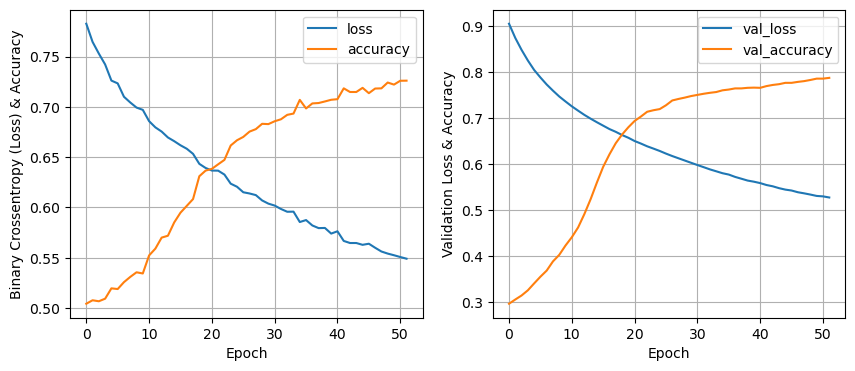

32 nodes, dropout 0, learning rate 0.01, batch size 16



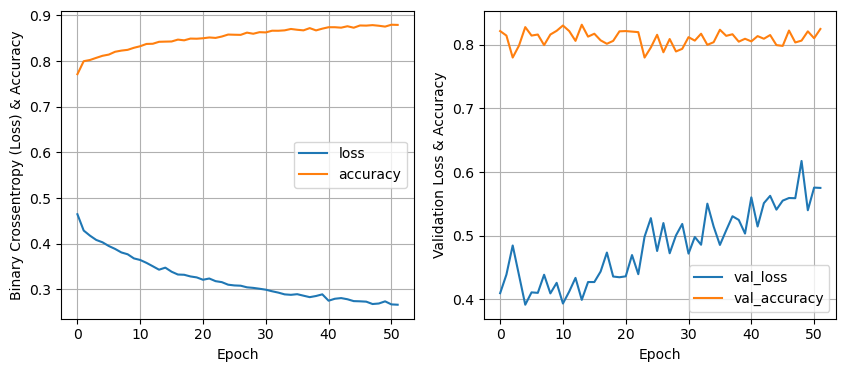

32 nodes, dropout 0, learning rate 0.01, batch size 32



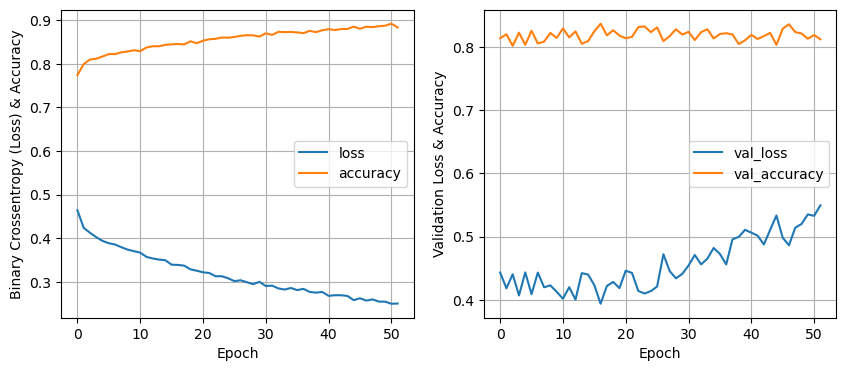

32 nodes, dropout 0, learning rate 0.01, batch size 64



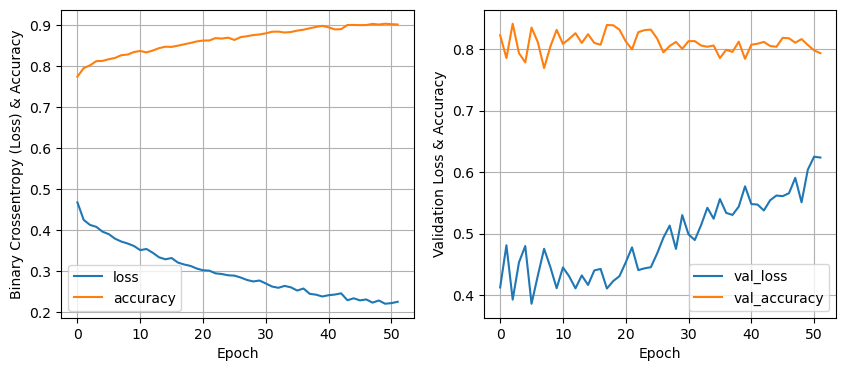

32 nodes, dropout 0, learning rate 0.01, batch size 128



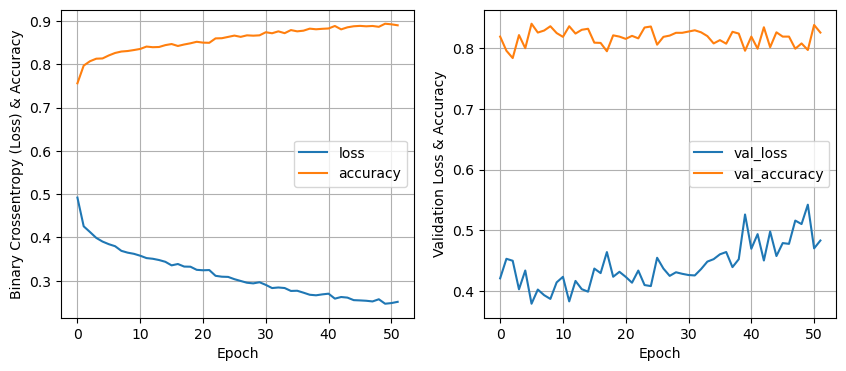

32 nodes, dropout 0, learning rate 0.01, batch size 256



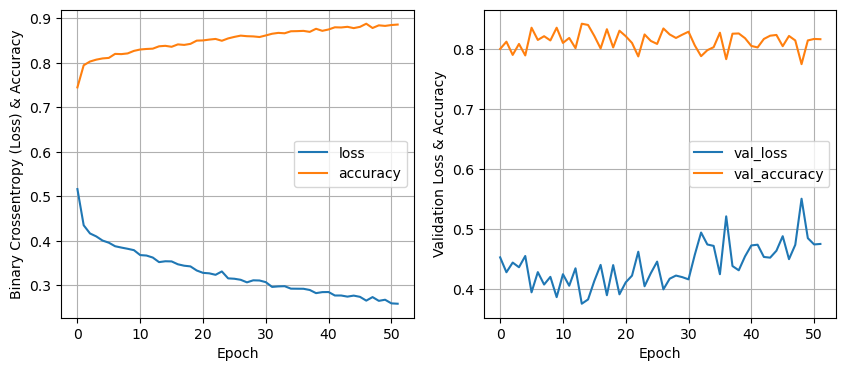

32 nodes, dropout 0, learning rate 0.005, batch size 16



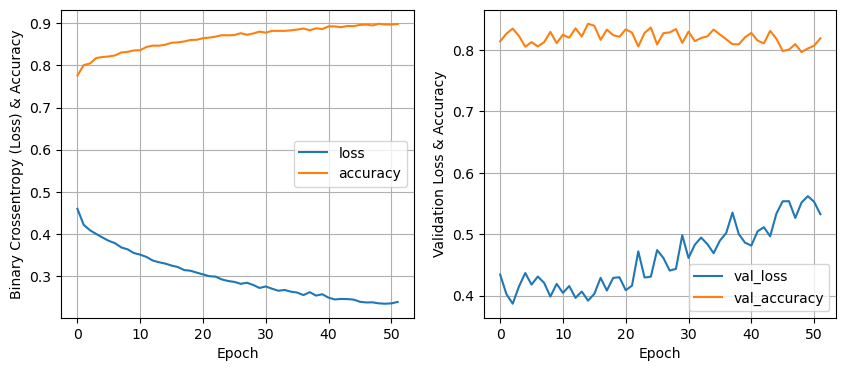

32 nodes, dropout 0, learning rate 0.005, batch size 32



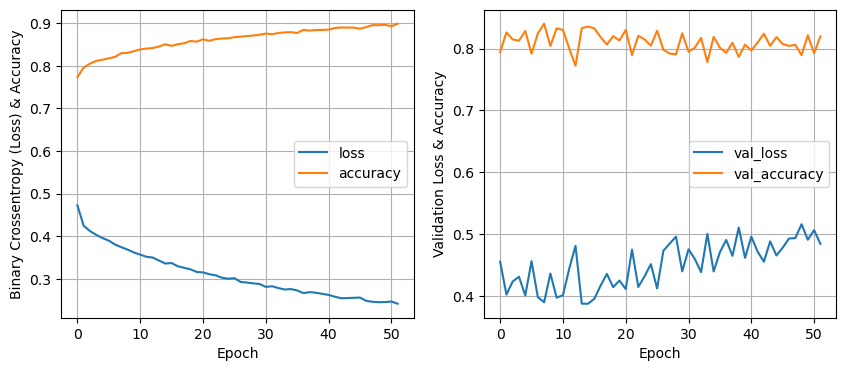

32 nodes, dropout 0, learning rate 0.005, batch size 64



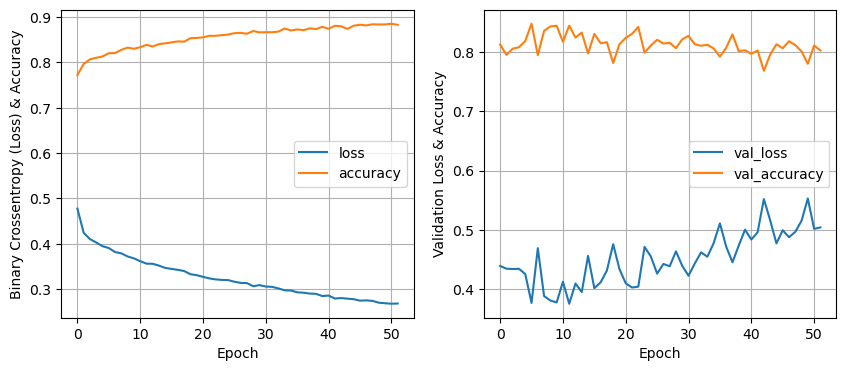

32 nodes, dropout 0, learning rate 0.005, batch size 128



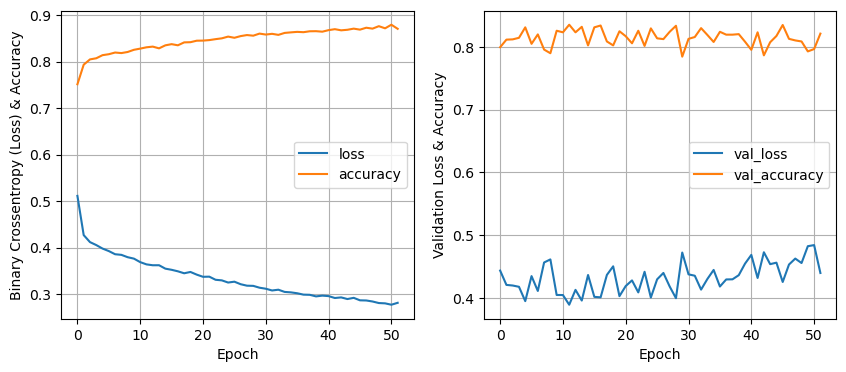

32 nodes, dropout 0, learning rate 0.005, batch size 256



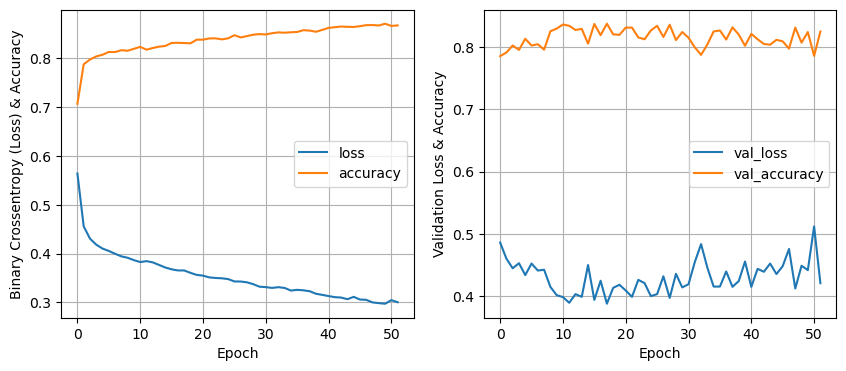

32 nodes, dropout 0, learning rate 0.0001, batch size 16



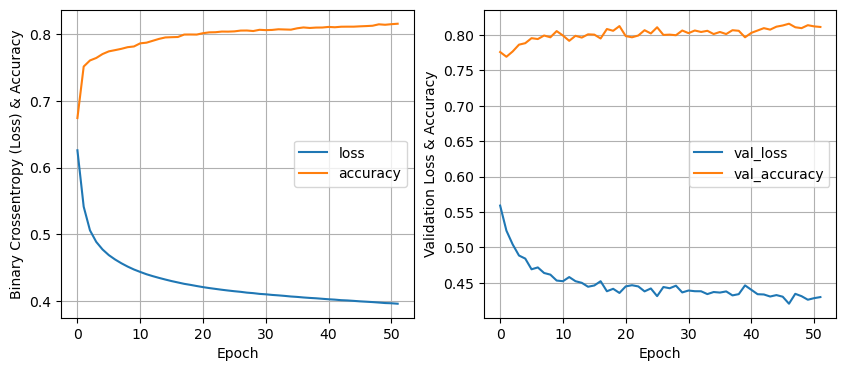

32 nodes, dropout 0, learning rate 0.0001, batch size 32



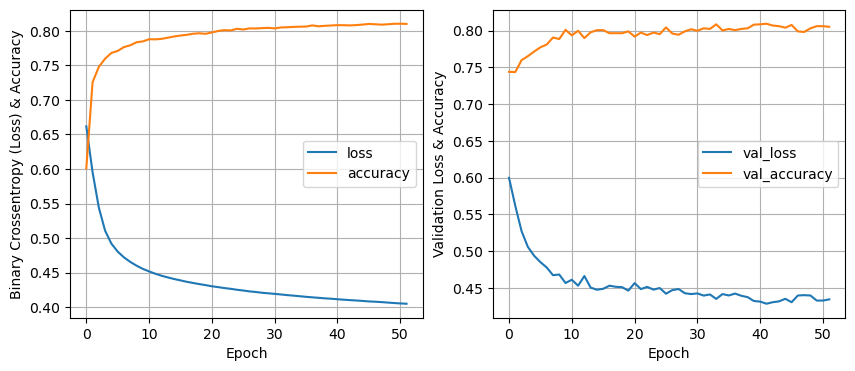

32 nodes, dropout 0, learning rate 0.0001, batch size 64



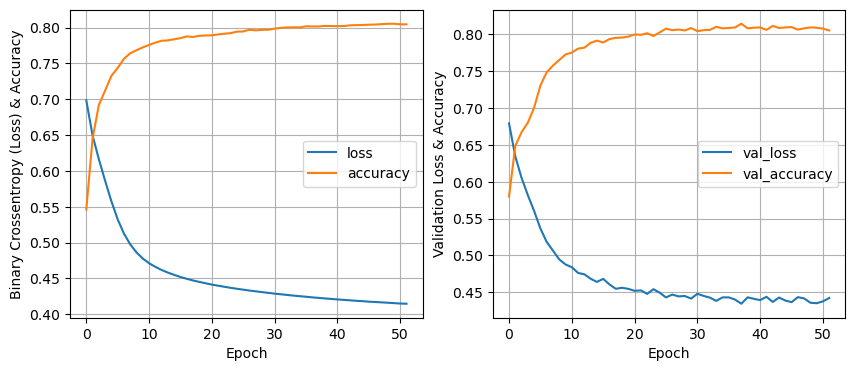

32 nodes, dropout 0, learning rate 0.0001, batch size 128



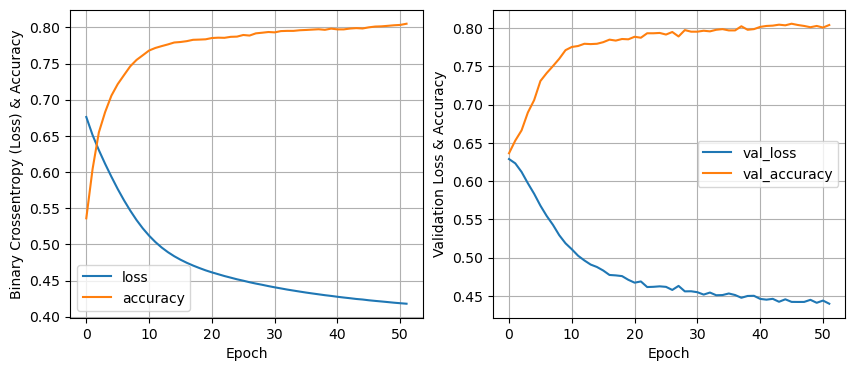

32 nodes, dropout 0, learning rate 0.0001, batch size 256



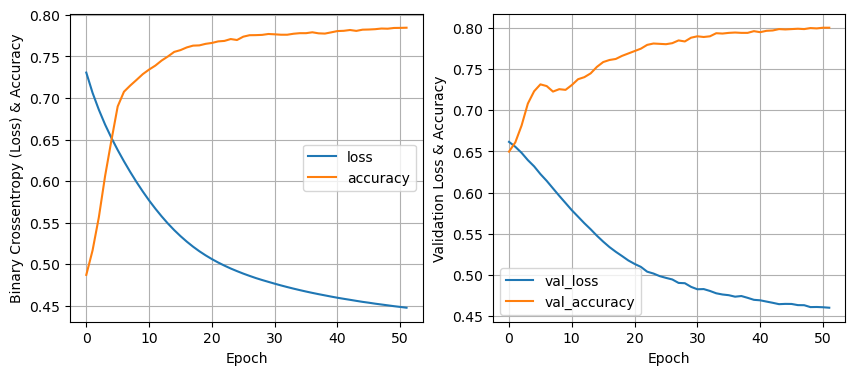

32 nodes, dropout 0.2, learning rate 0.01, batch size 16



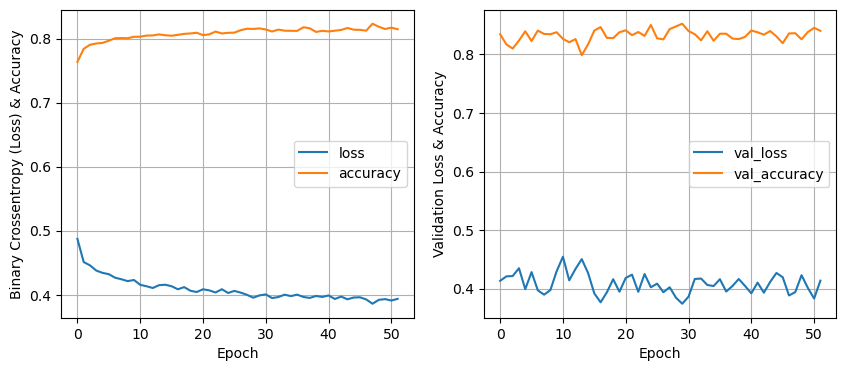

32 nodes, dropout 0.2, learning rate 0.01, batch size 32



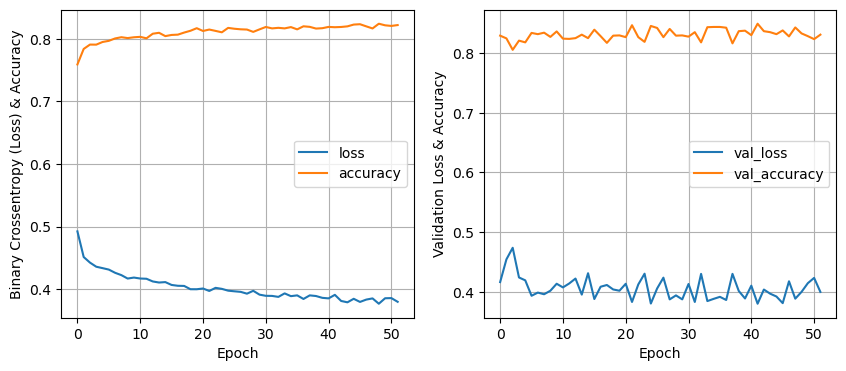

32 nodes, dropout 0.2, learning rate 0.01, batch size 64



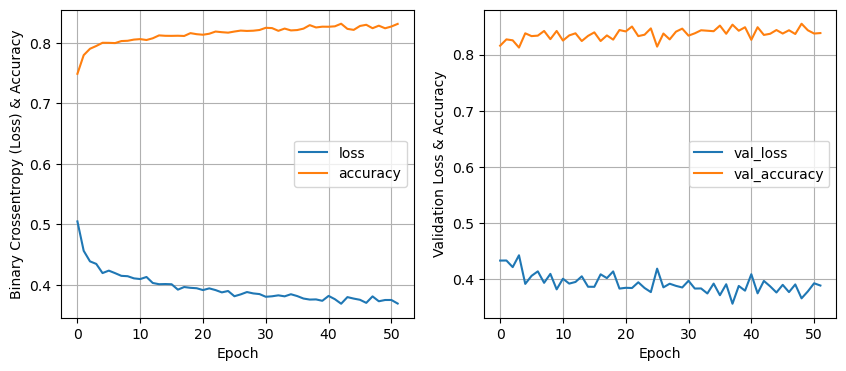

32 nodes, dropout 0.2, learning rate 0.01, batch size 128



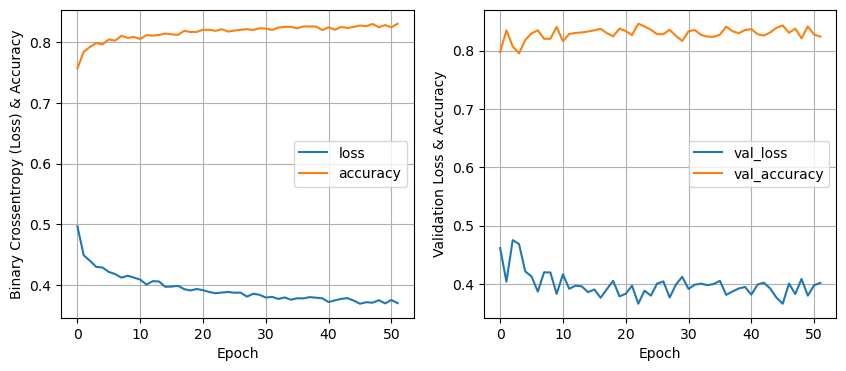

32 nodes, dropout 0.2, learning rate 0.01, batch size 256



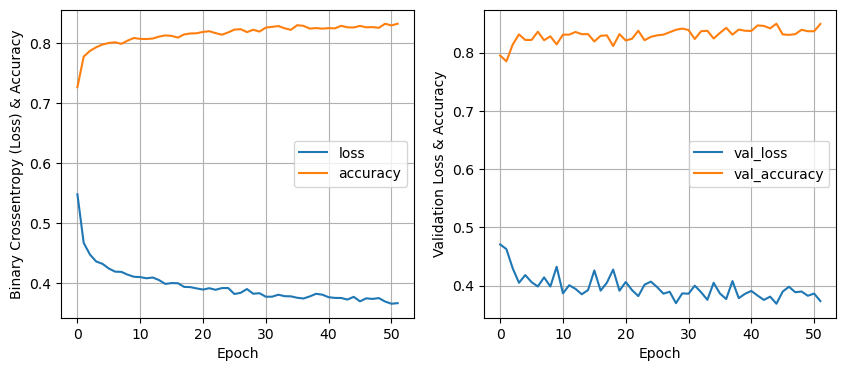

32 nodes, dropout 0.2, learning rate 0.005, batch size 16



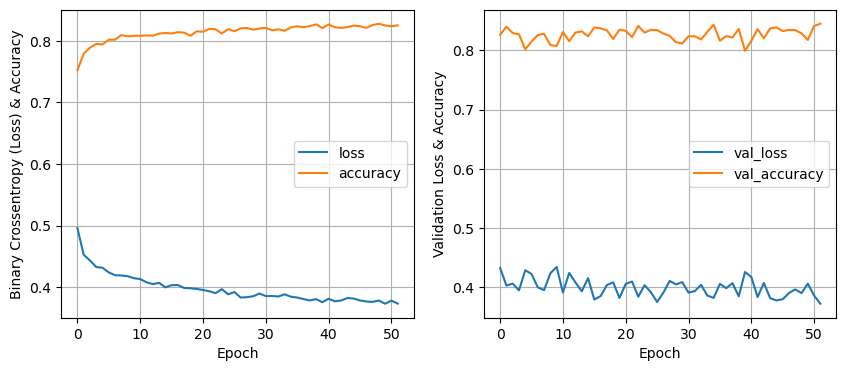

32 nodes, dropout 0.2, learning rate 0.005, batch size 32



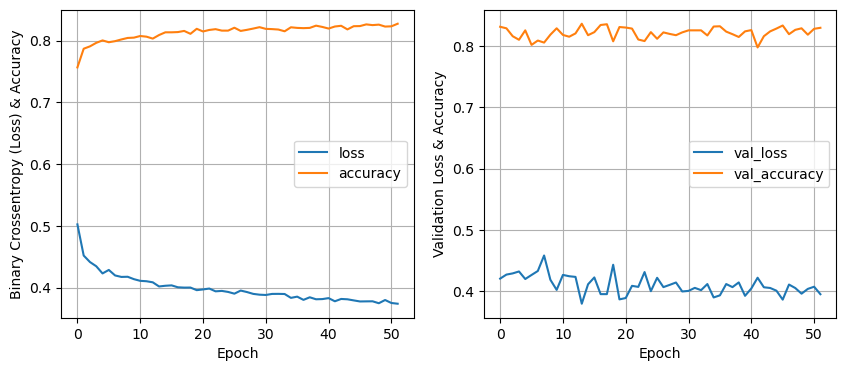

32 nodes, dropout 0.2, learning rate 0.005, batch size 64



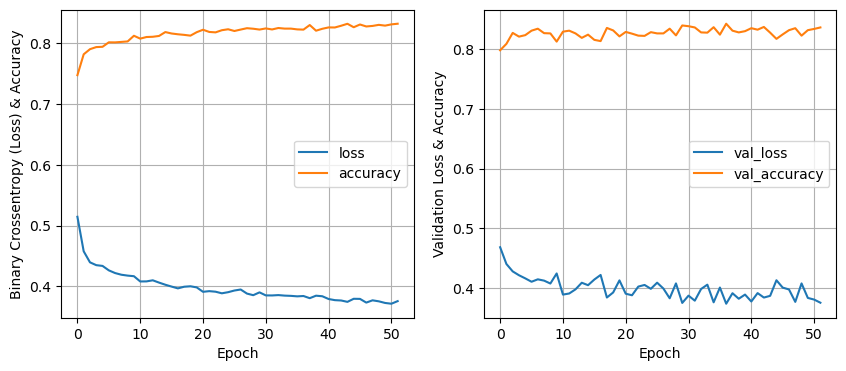

32 nodes, dropout 0.2, learning rate 0.005, batch size 128



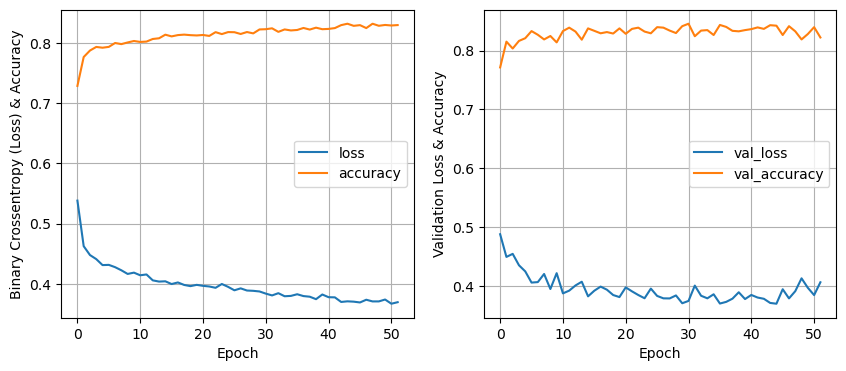

32 nodes, dropout 0.2, learning rate 0.005, batch size 256



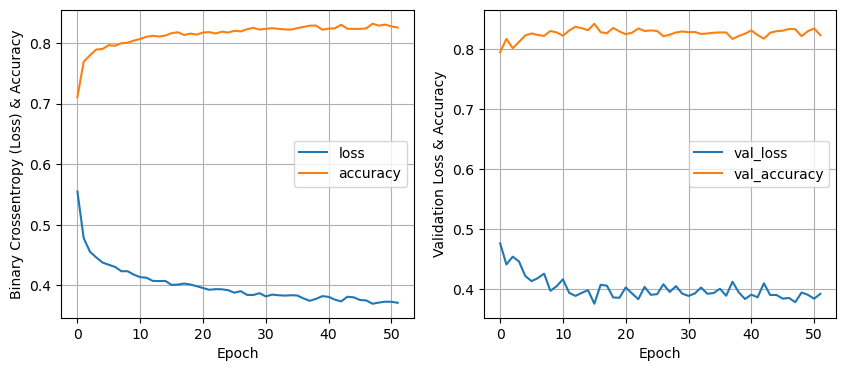

32 nodes, dropout 0.2, learning rate 0.0001, batch size 16



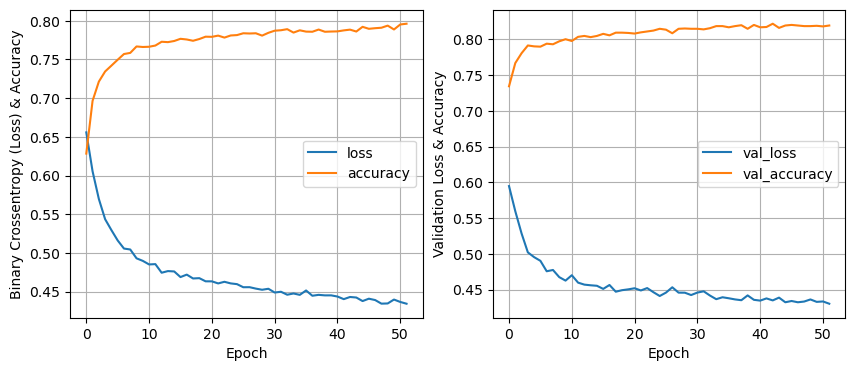

32 nodes, dropout 0.2, learning rate 0.0001, batch size 32



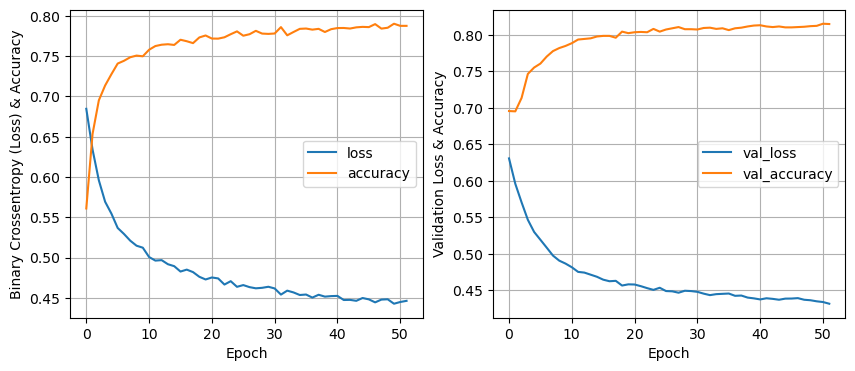

32 nodes, dropout 0.2, learning rate 0.0001, batch size 64



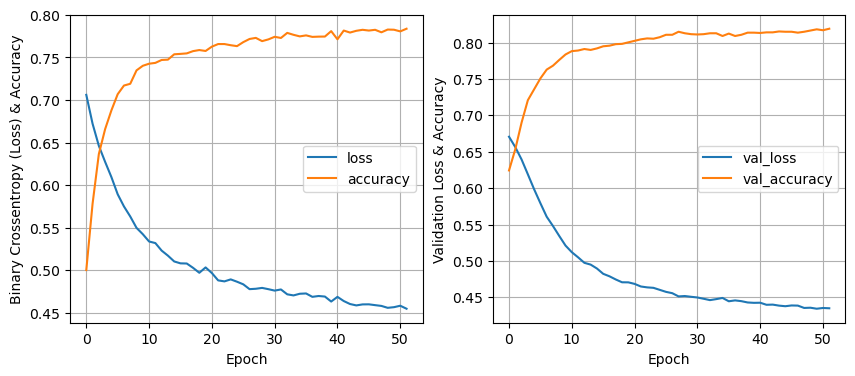

32 nodes, dropout 0.2, learning rate 0.0001, batch size 128



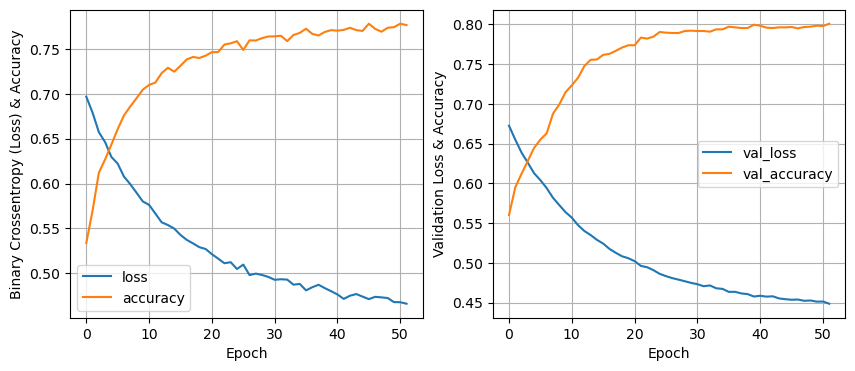

32 nodes, dropout 0.2, learning rate 0.0001, batch size 256



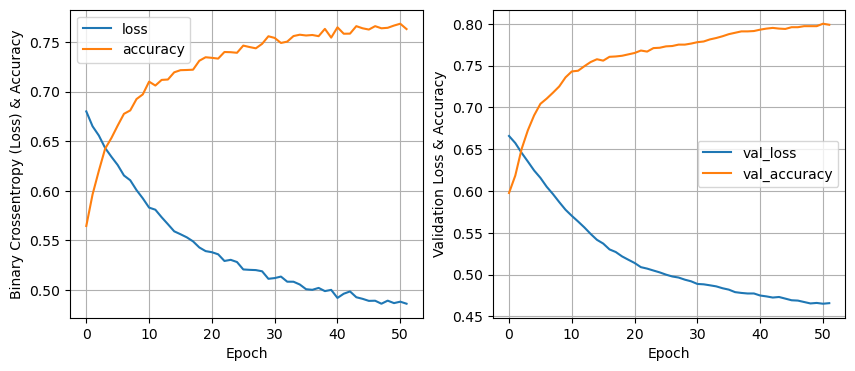

64 nodes, dropout 0, learning rate 0.01, batch size 16



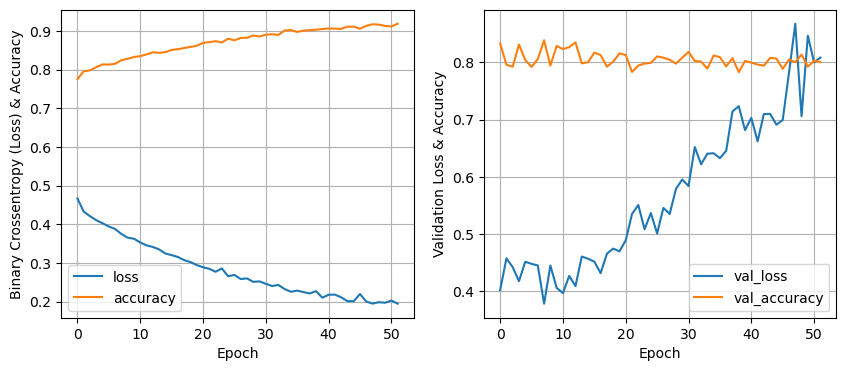

64 nodes, dropout 0, learning rate 0.01, batch size 32



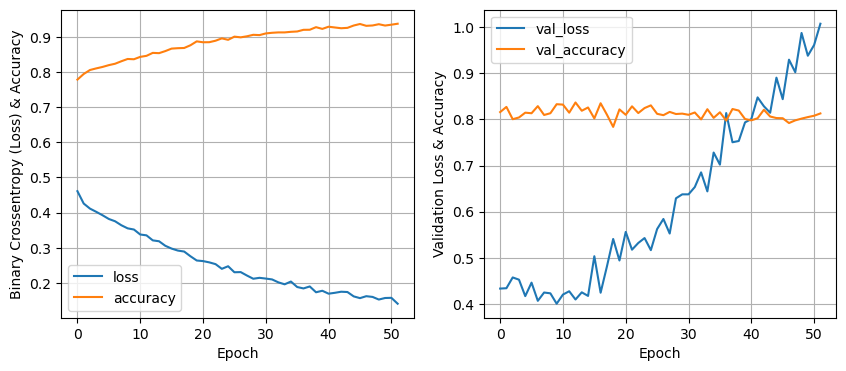

64 nodes, dropout 0, learning rate 0.01, batch size 64



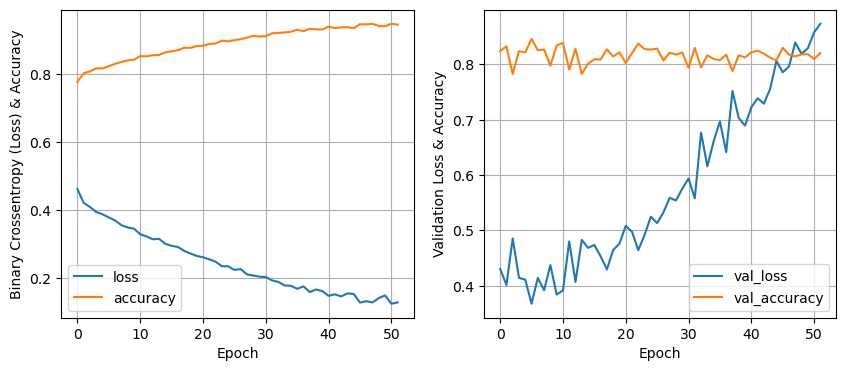

64 nodes, dropout 0, learning rate 0.01, batch size 128



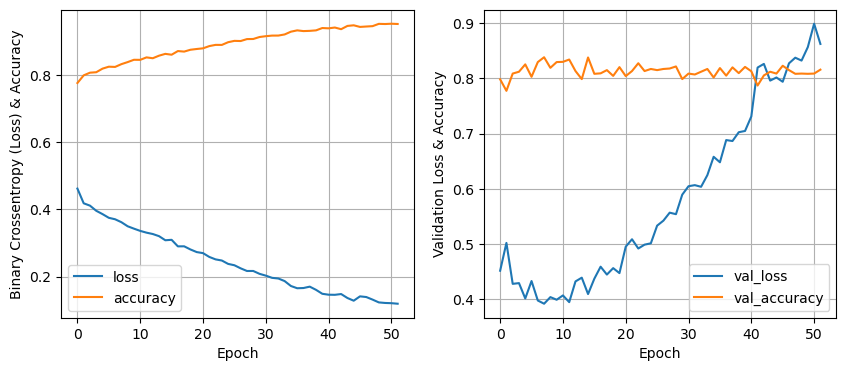

64 nodes, dropout 0, learning rate 0.01, batch size 256



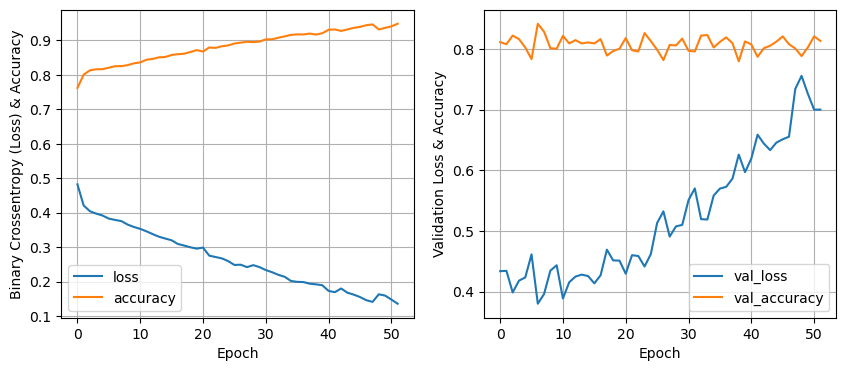

64 nodes, dropout 0, learning rate 0.005, batch size 16



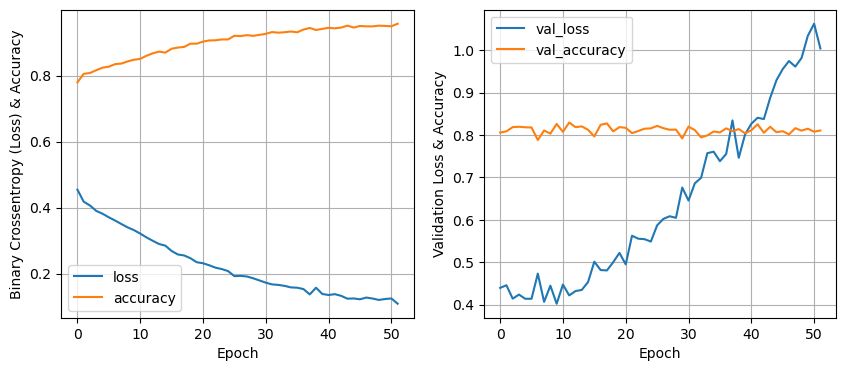

64 nodes, dropout 0, learning rate 0.005, batch size 32



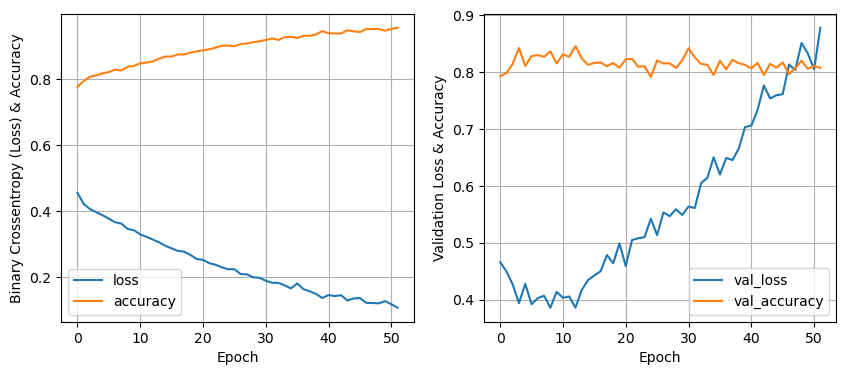

64 nodes, dropout 0, learning rate 0.005, batch size 64



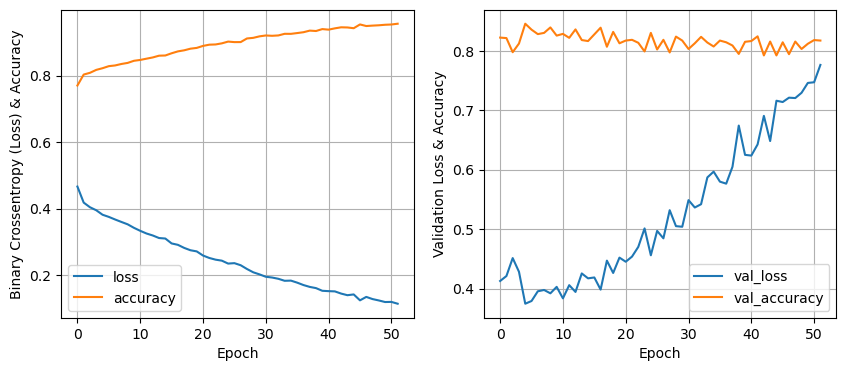

64 nodes, dropout 0, learning rate 0.005, batch size 128



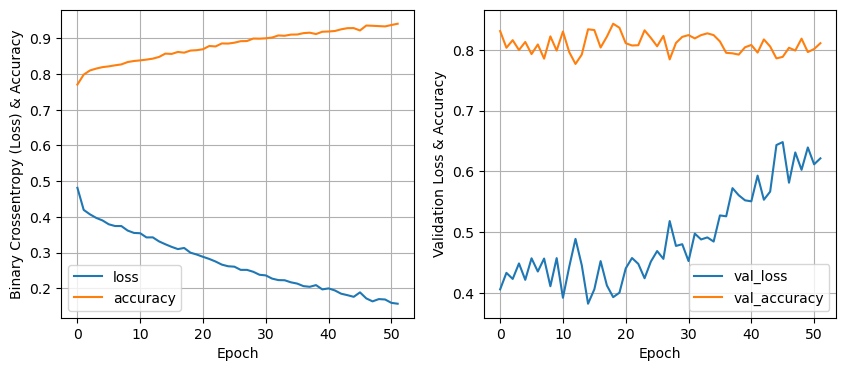

64 nodes, dropout 0, learning rate 0.005, batch size 256



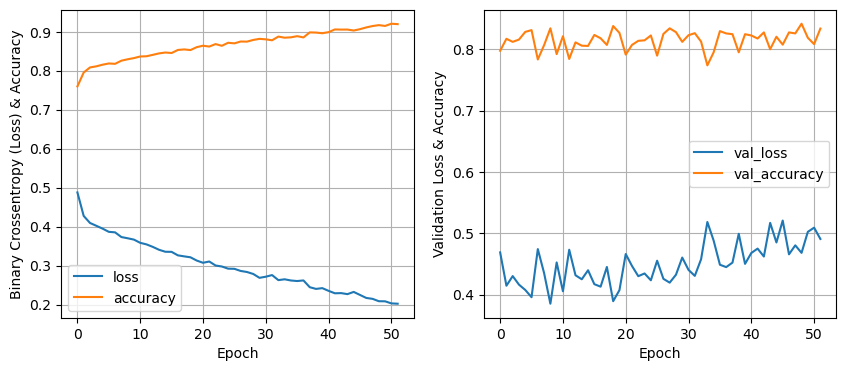

64 nodes, dropout 0, learning rate 0.0001, batch size 16



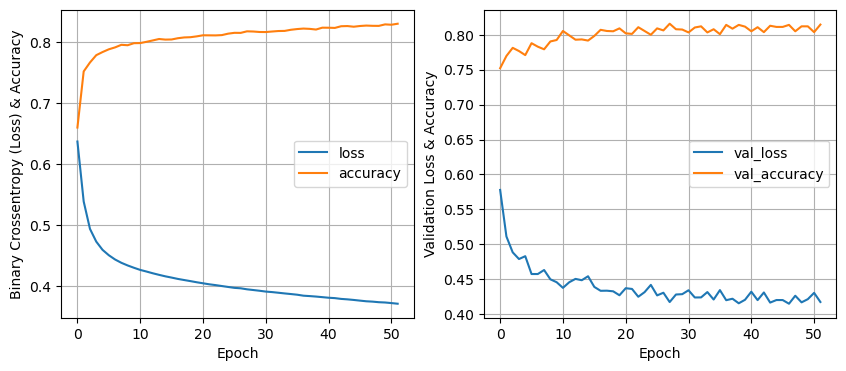

64 nodes, dropout 0, learning rate 0.0001, batch size 32



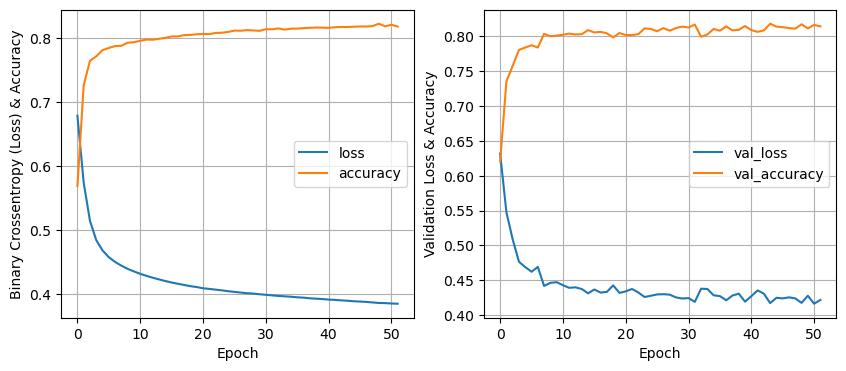

64 nodes, dropout 0, learning rate 0.0001, batch size 64



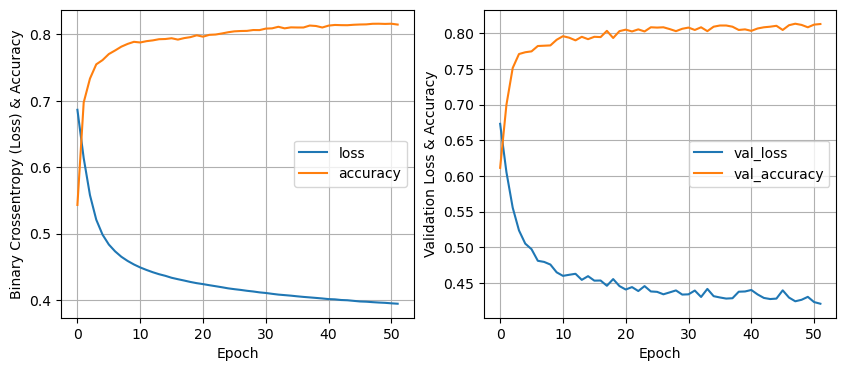

64 nodes, dropout 0, learning rate 0.0001, batch size 128



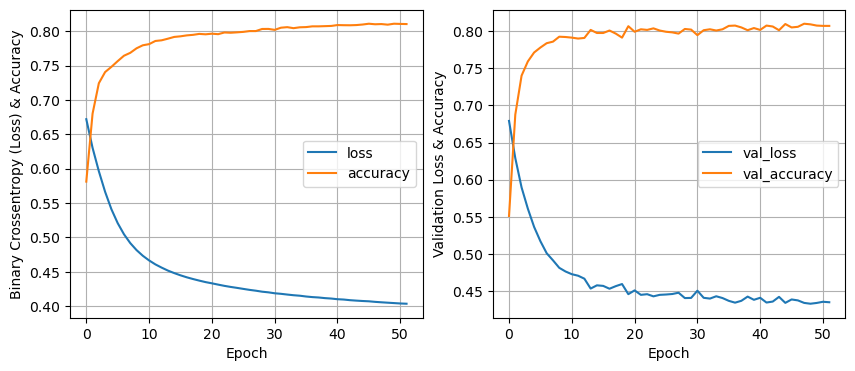

64 nodes, dropout 0, learning rate 0.0001, batch size 256



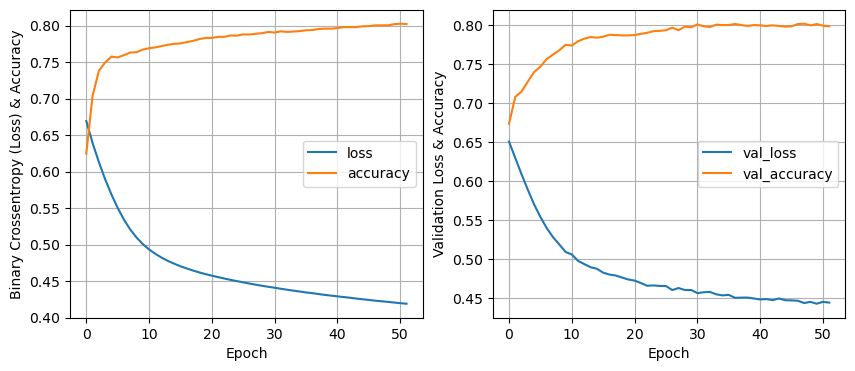

64 nodes, dropout 0.2, learning rate 0.01, batch size 16



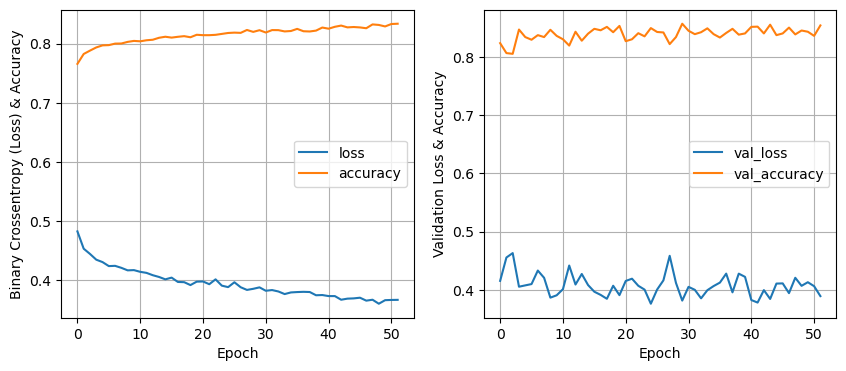

64 nodes, dropout 0.2, learning rate 0.01, batch size 32



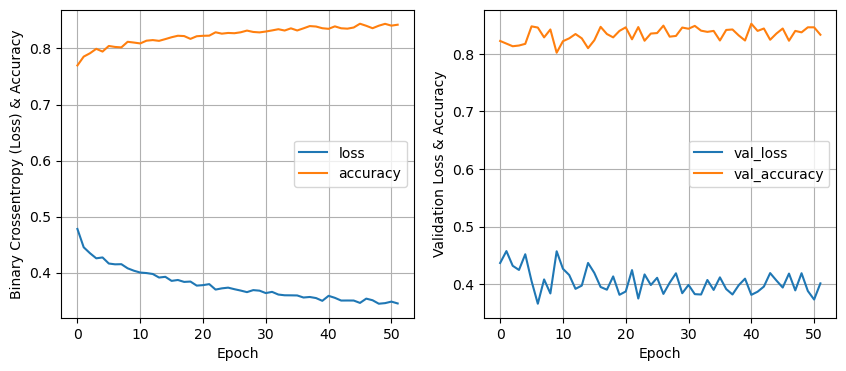

64 nodes, dropout 0.2, learning rate 0.01, batch size 64



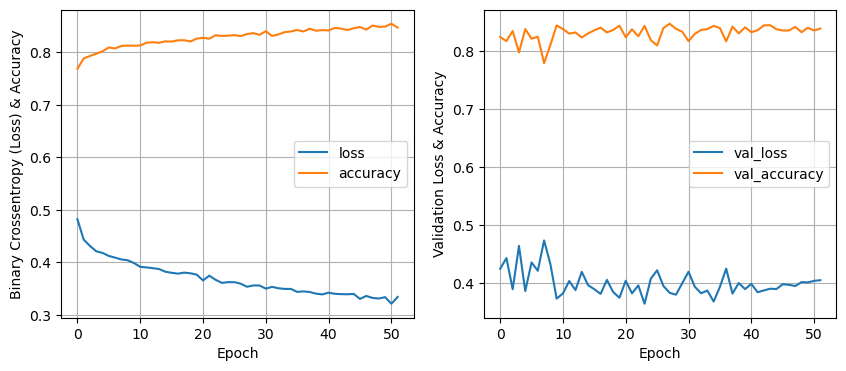

64 nodes, dropout 0.2, learning rate 0.01, batch size 128



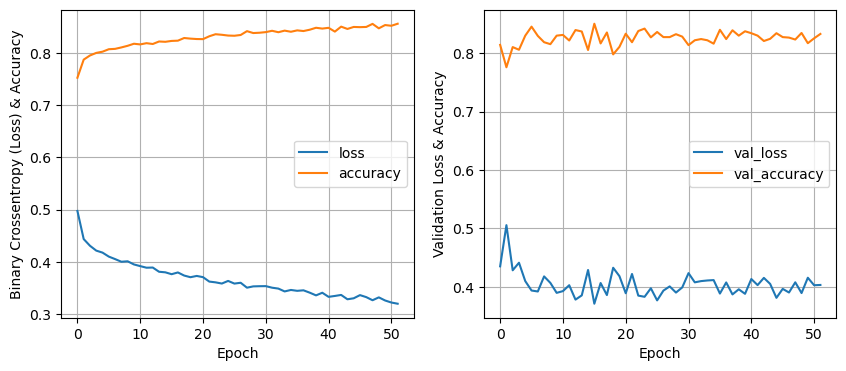

64 nodes, dropout 0.2, learning rate 0.01, batch size 256



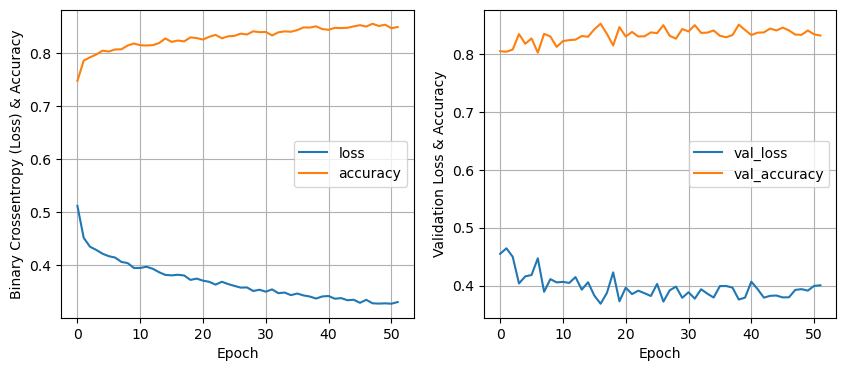

64 nodes, dropout 0.2, learning rate 0.005, batch size 16



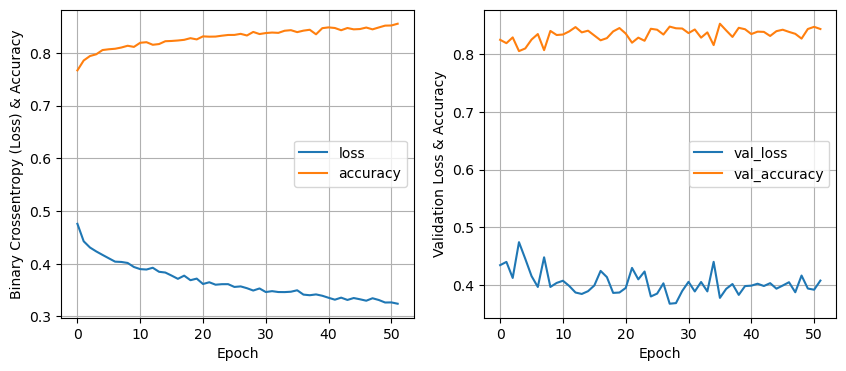

64 nodes, dropout 0.2, learning rate 0.005, batch size 32



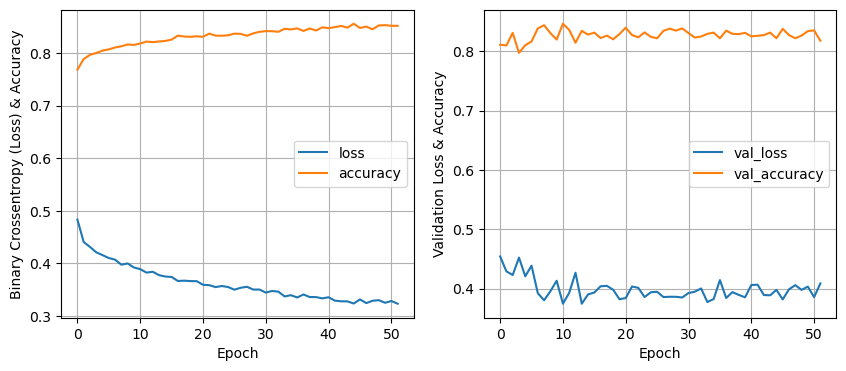

64 nodes, dropout 0.2, learning rate 0.005, batch size 64



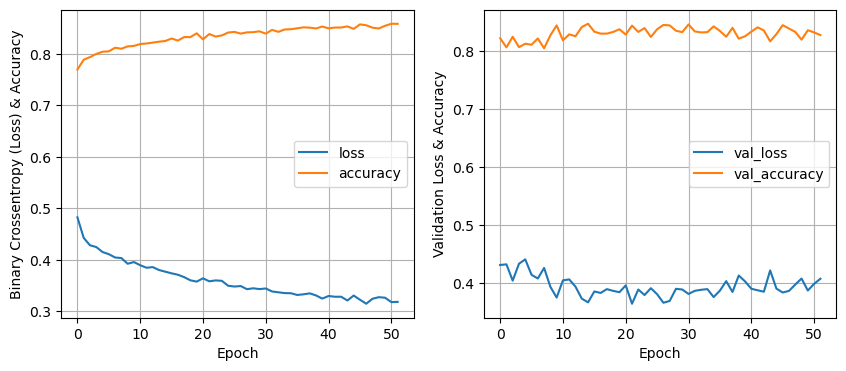

64 nodes, dropout 0.2, learning rate 0.005, batch size 128



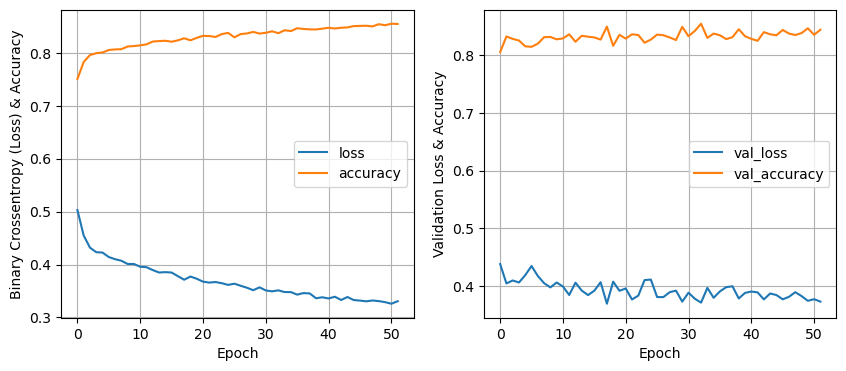

64 nodes, dropout 0.2, learning rate 0.005, batch size 256



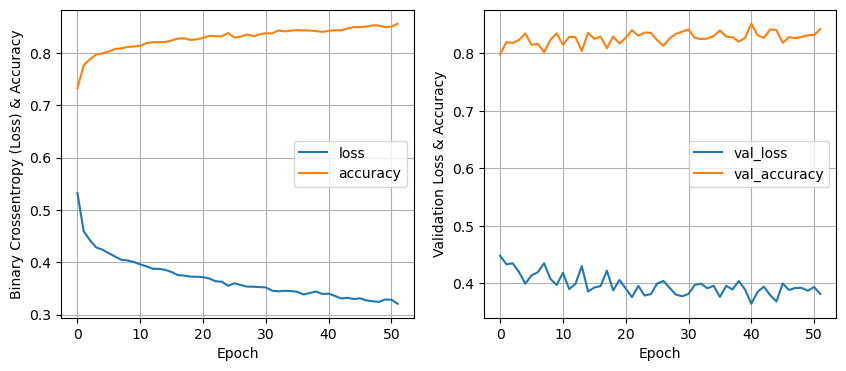

64 nodes, dropout 0.2, learning rate 0.0001, batch size 16



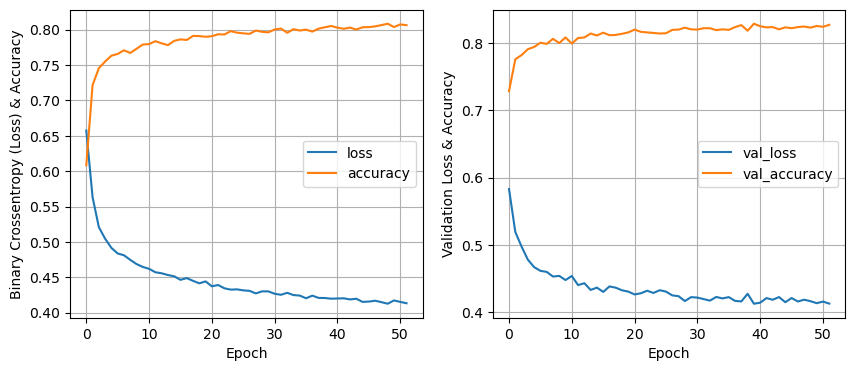

64 nodes, dropout 0.2, learning rate 0.0001, batch size 32



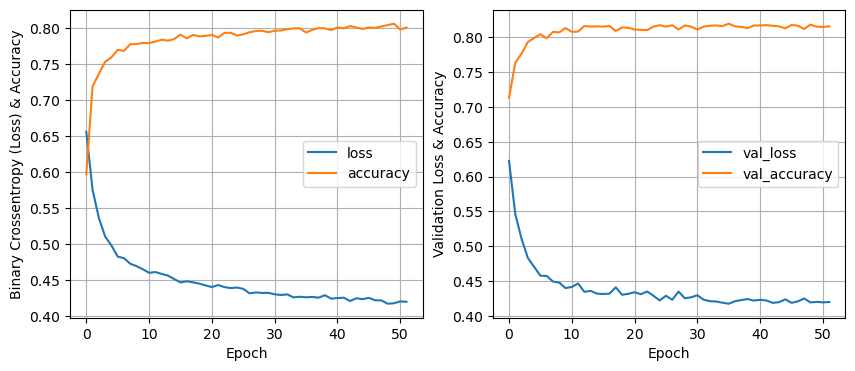

64 nodes, dropout 0.2, learning rate 0.0001, batch size 64



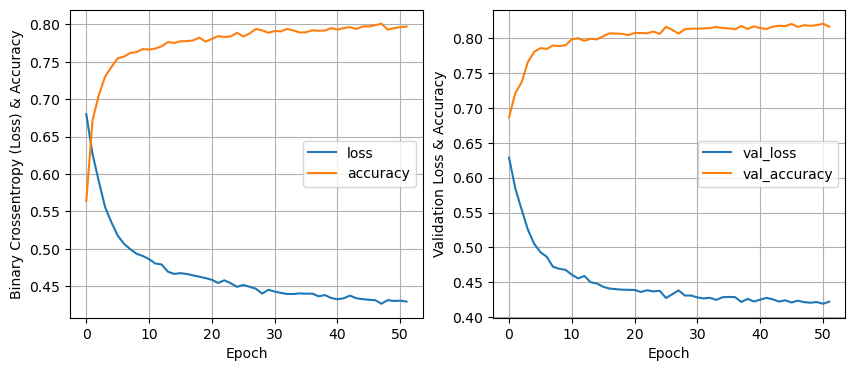

64 nodes, dropout 0.2, learning rate 0.0001, batch size 128



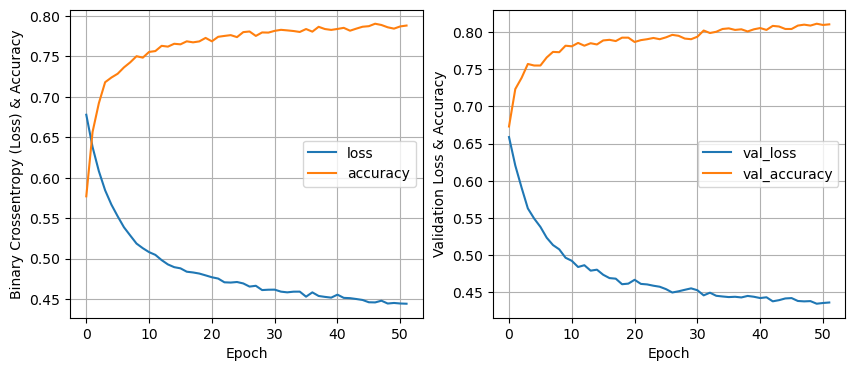

64 nodes, dropout 0.2, learning rate 0.0001, batch size 256



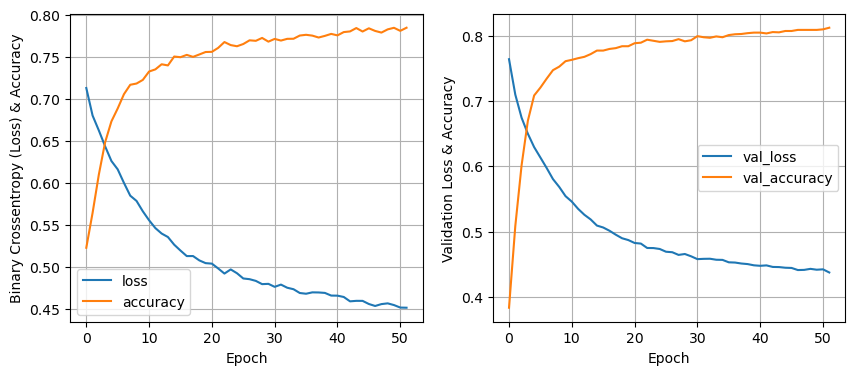

128 nodes, dropout 0, learning rate 0.01, batch size 16



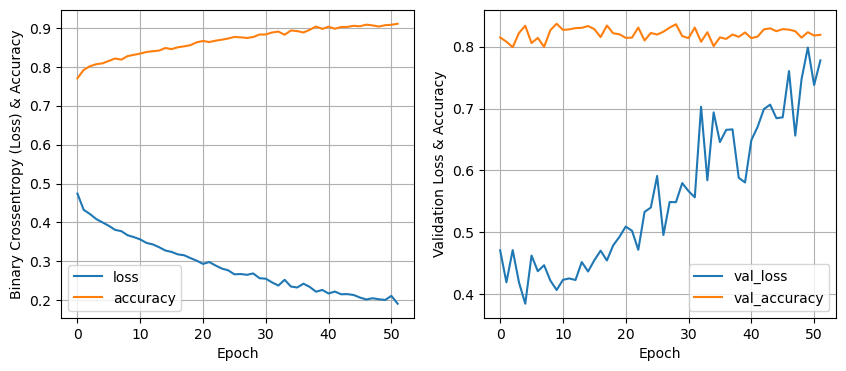

128 nodes, dropout 0, learning rate 0.01, batch size 32



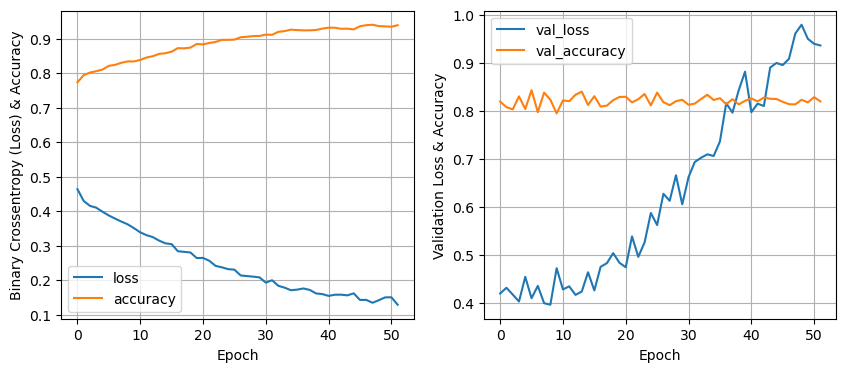

128 nodes, dropout 0, learning rate 0.01, batch size 64



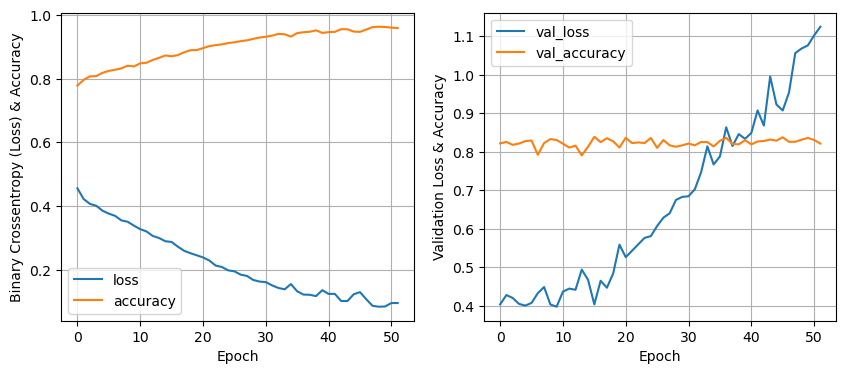

128 nodes, dropout 0, learning rate 0.01, batch size 128



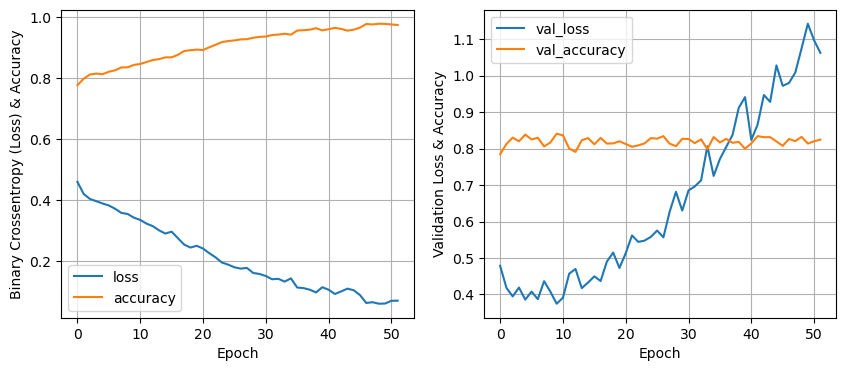

128 nodes, dropout 0, learning rate 0.01, batch size 256



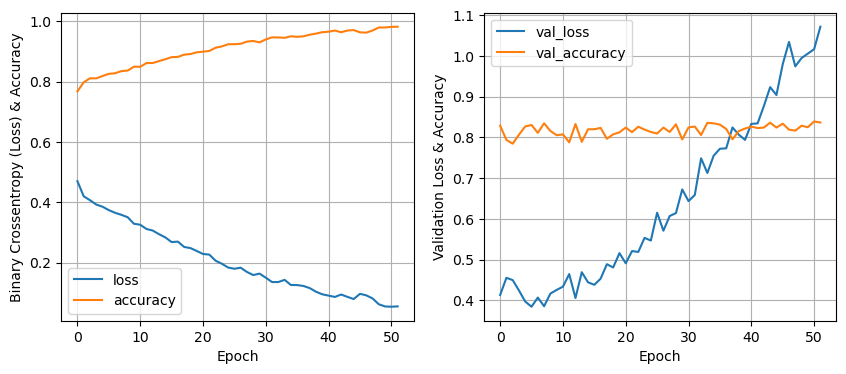

128 nodes, dropout 0, learning rate 0.005, batch size 16



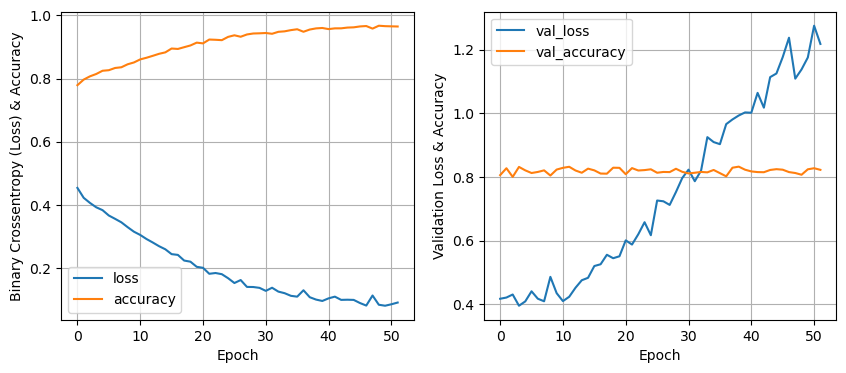

128 nodes, dropout 0, learning rate 0.005, batch size 32



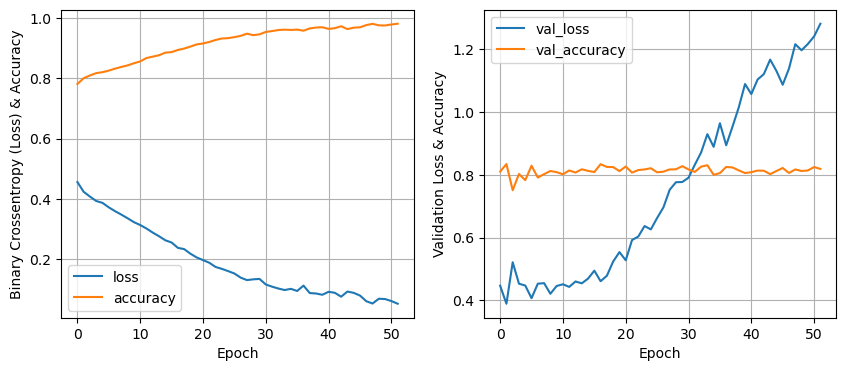

128 nodes, dropout 0, learning rate 0.005, batch size 64



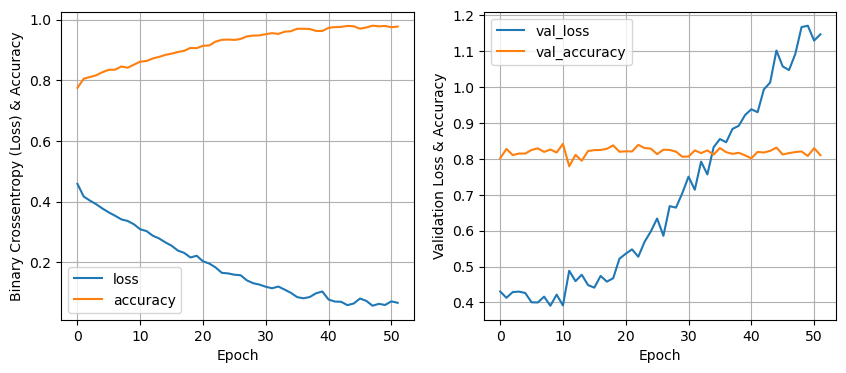

128 nodes, dropout 0, learning rate 0.005, batch size 128



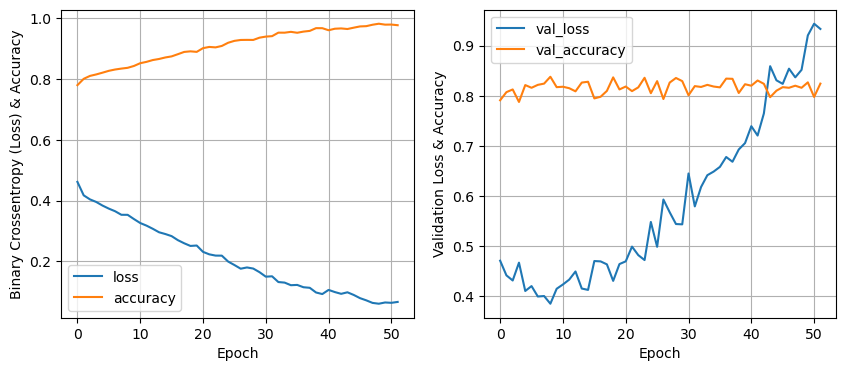

128 nodes, dropout 0, learning rate 0.005, batch size 256



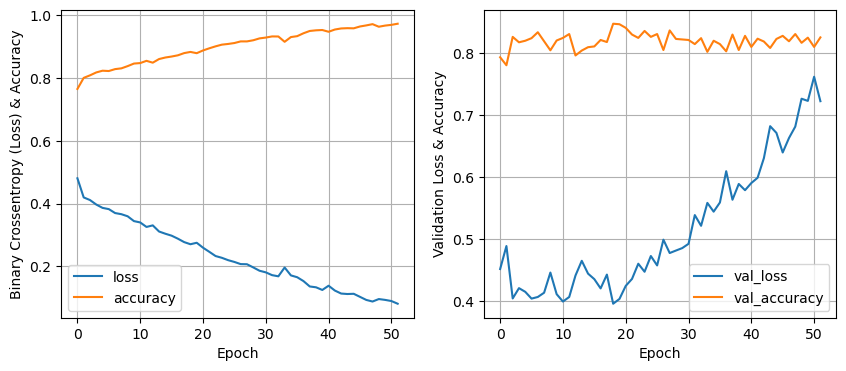

128 nodes, dropout 0, learning rate 0.0001, batch size 16



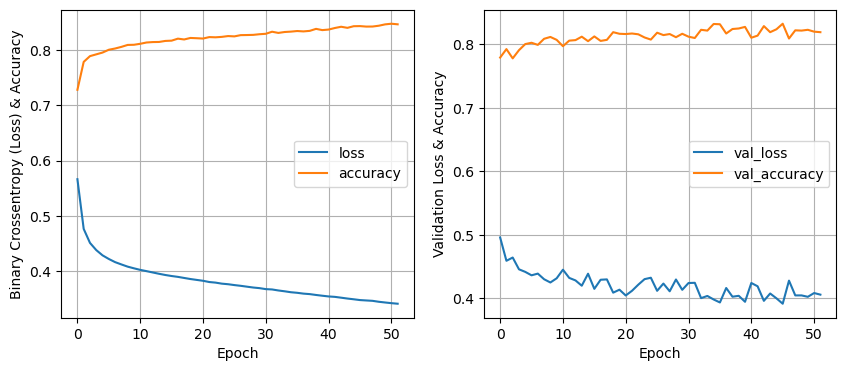

128 nodes, dropout 0, learning rate 0.0001, batch size 32



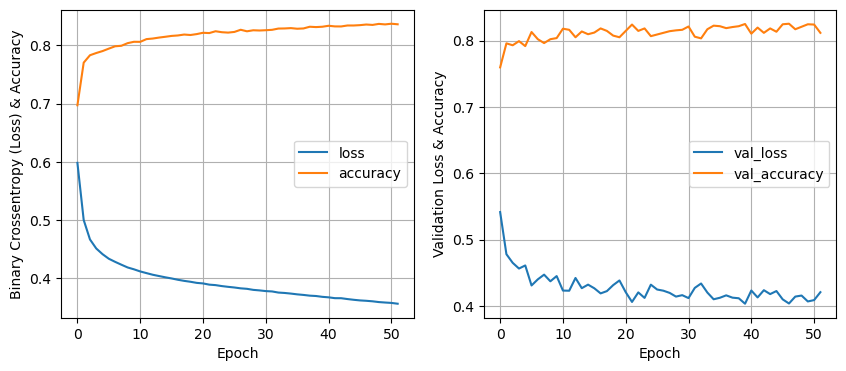

128 nodes, dropout 0, learning rate 0.0001, batch size 64



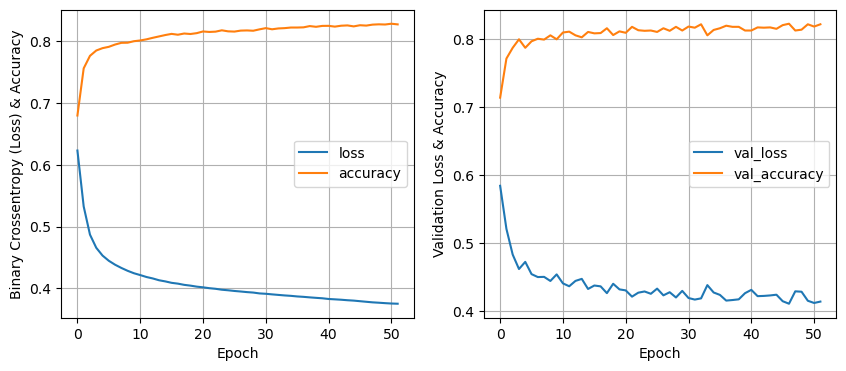

128 nodes, dropout 0, learning rate 0.0001, batch size 128



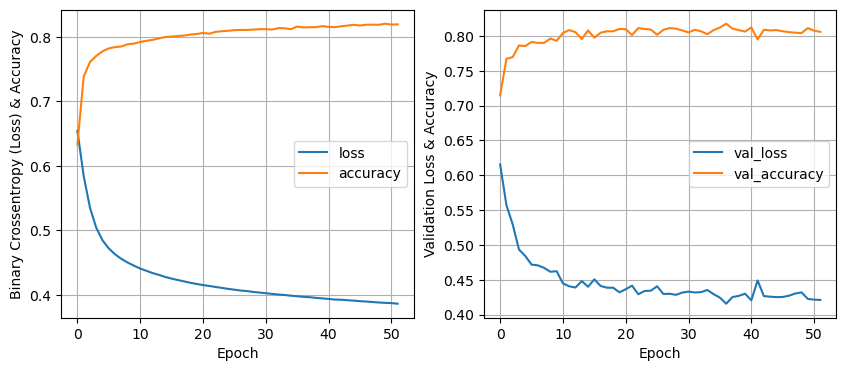

128 nodes, dropout 0, learning rate 0.0001, batch size 256



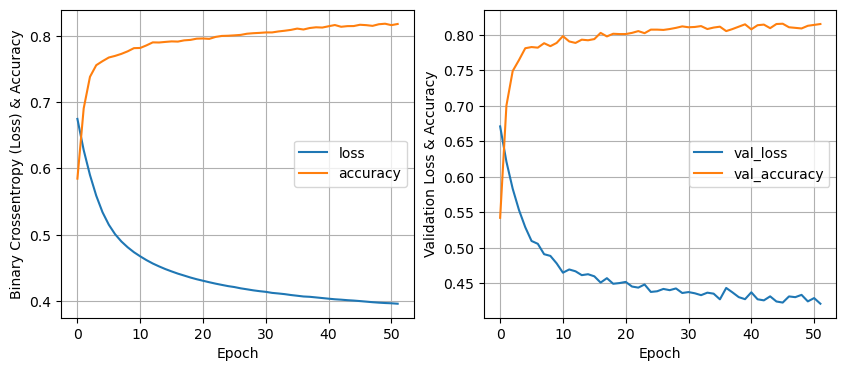

128 nodes, dropout 0.2, learning rate 0.01, batch size 16



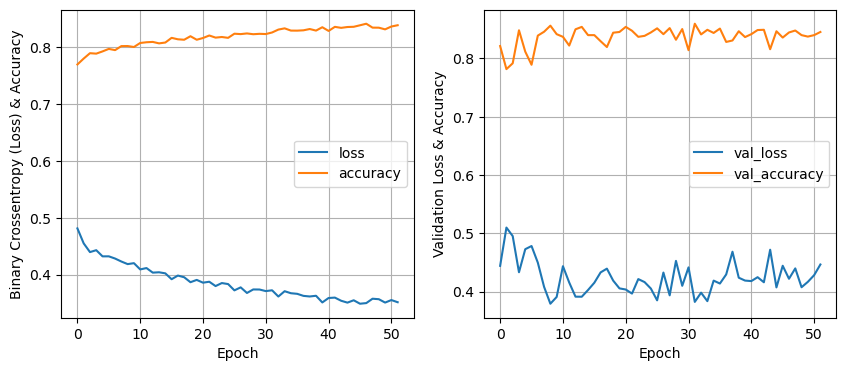

128 nodes, dropout 0.2, learning rate 0.01, batch size 32



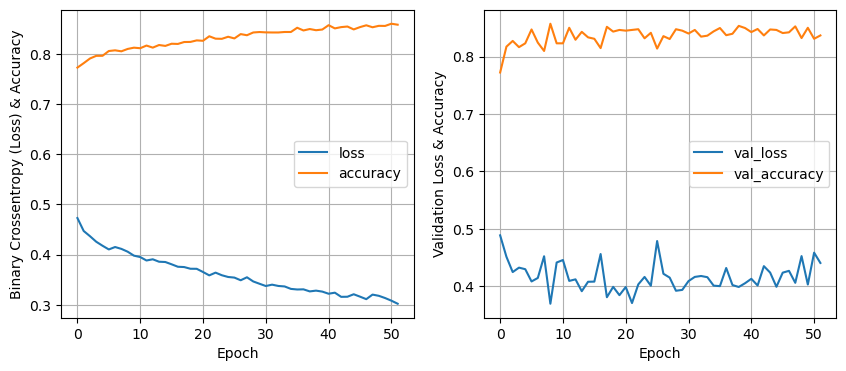

128 nodes, dropout 0.2, learning rate 0.01, batch size 64



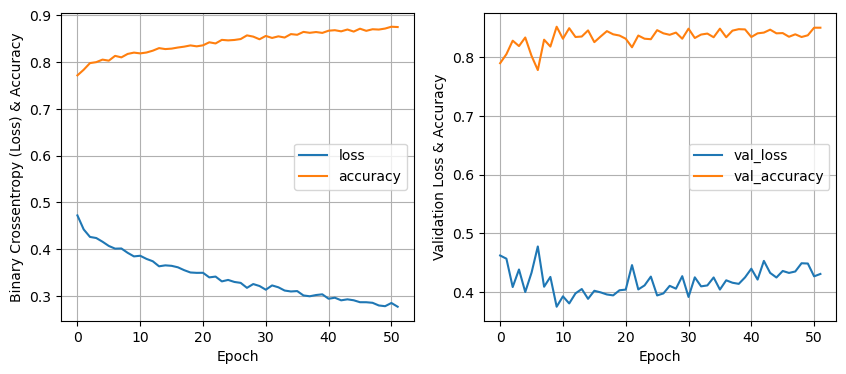

128 nodes, dropout 0.2, learning rate 0.01, batch size 128



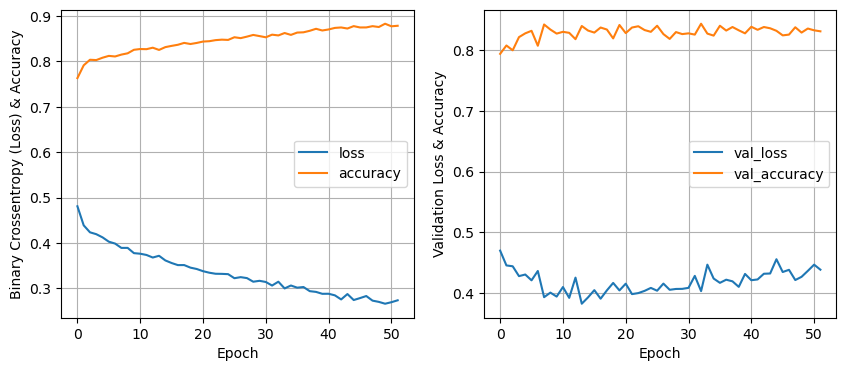

128 nodes, dropout 0.2, learning rate 0.01, batch size 256



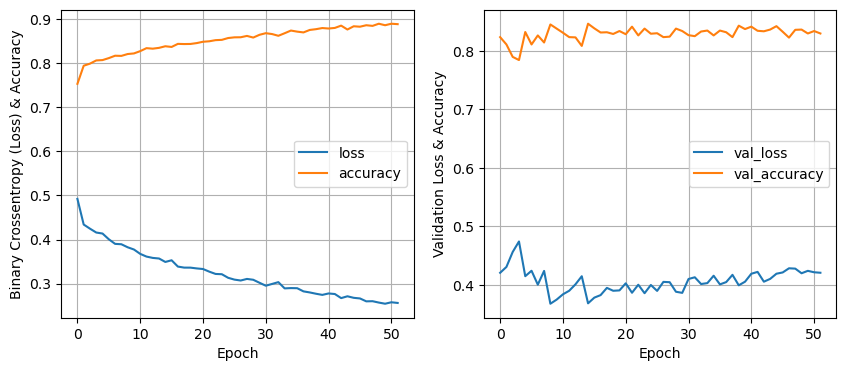

128 nodes, dropout 0.2, learning rate 0.005, batch size 16



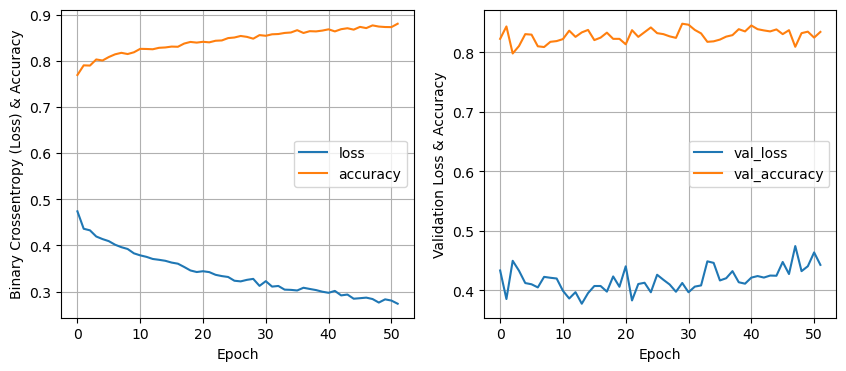

128 nodes, dropout 0.2, learning rate 0.005, batch size 32



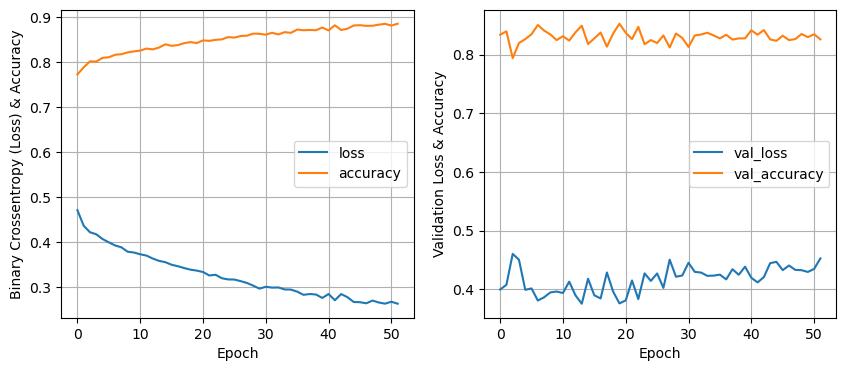

128 nodes, dropout 0.2, learning rate 0.005, batch size 64



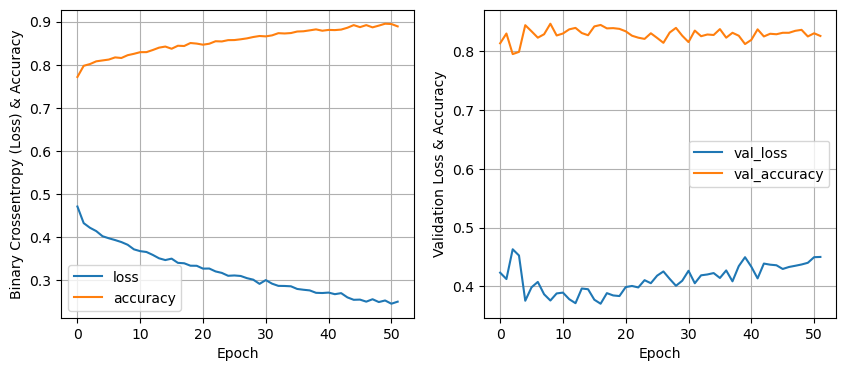

128 nodes, dropout 0.2, learning rate 0.005, batch size 128



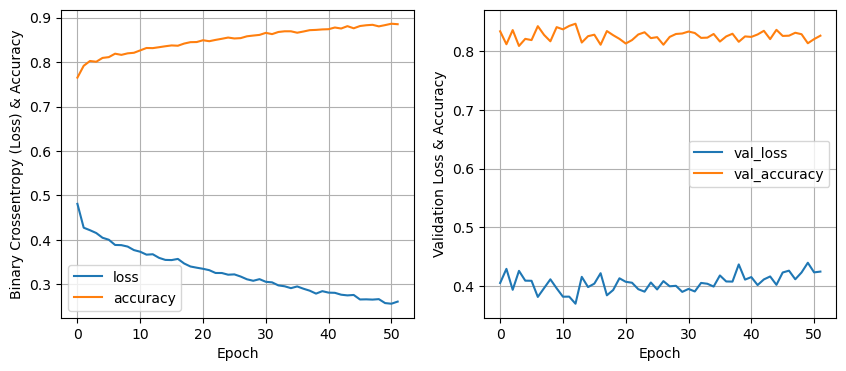

128 nodes, dropout 0.2, learning rate 0.005, batch size 256



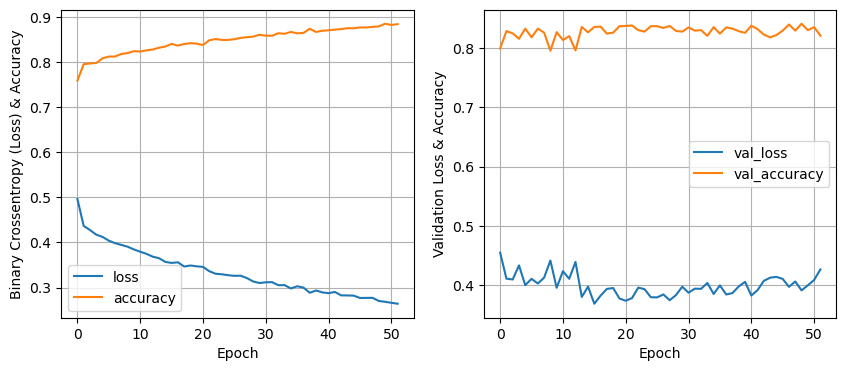

128 nodes, dropout 0.2, learning rate 0.0001, batch size 16



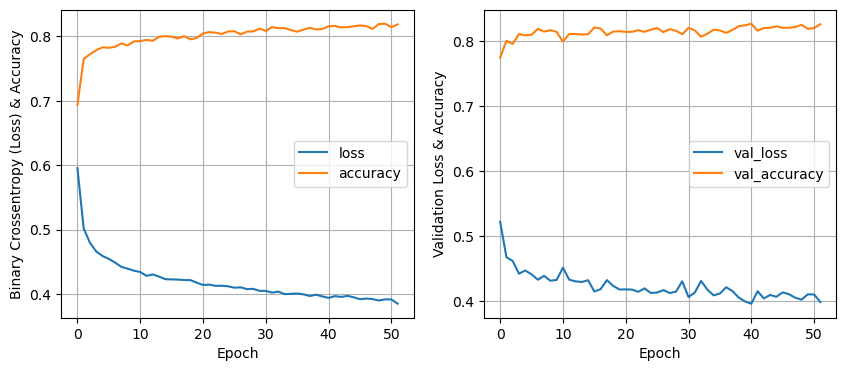

128 nodes, dropout 0.2, learning rate 0.0001, batch size 32



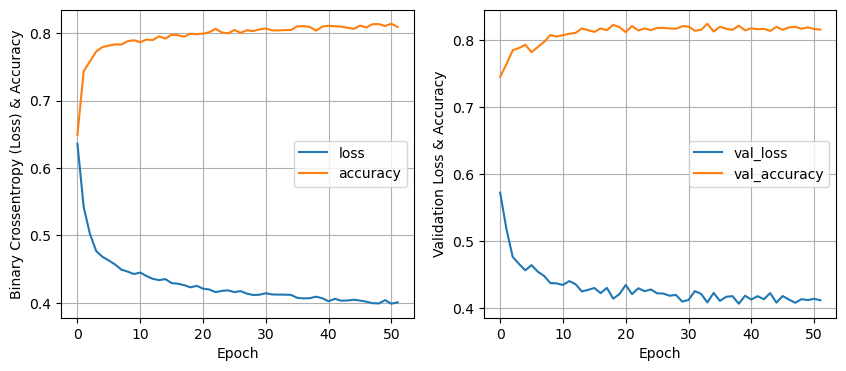

128 nodes, dropout 0.2, learning rate 0.0001, batch size 64



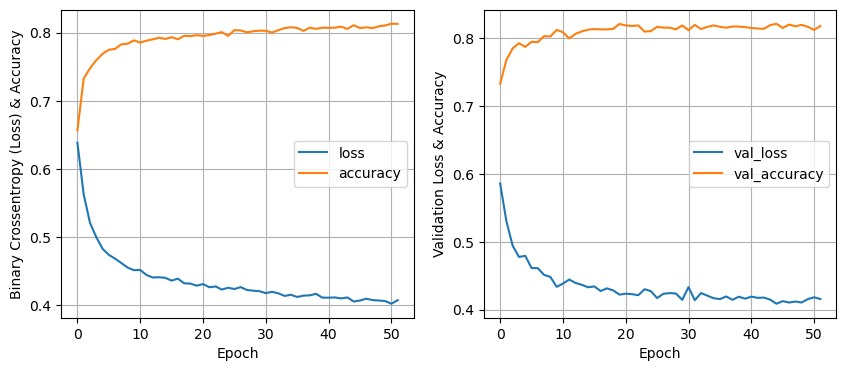

128 nodes, dropout 0.2, learning rate 0.0001, batch size 128



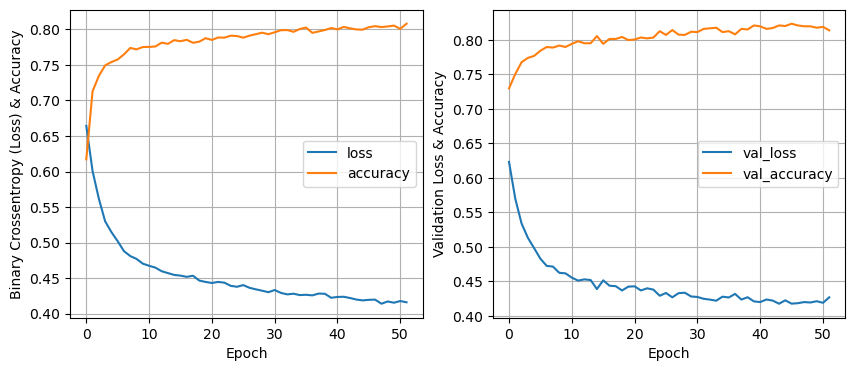

128 nodes, dropout 0.2, learning rate 0.0001, batch size 256



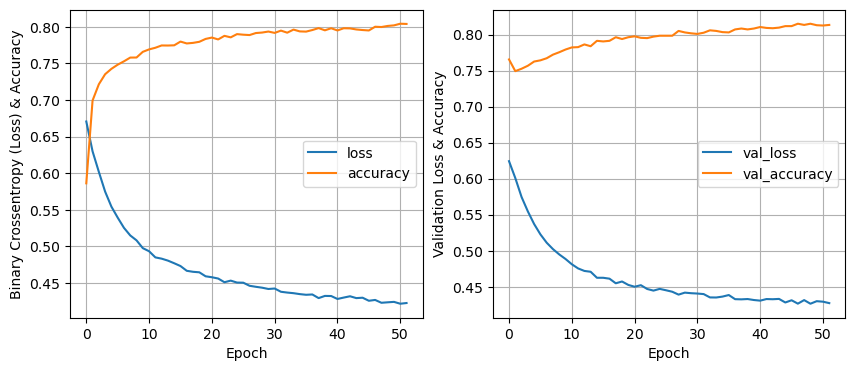

256 nodes, dropout 0, learning rate 0.01, batch size 16



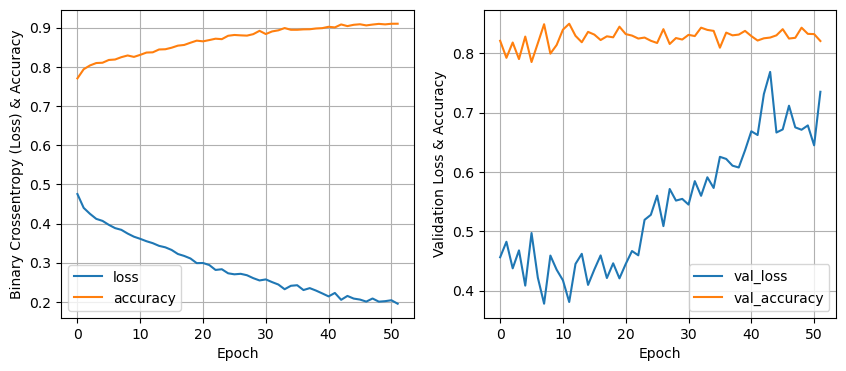

256 nodes, dropout 0, learning rate 0.01, batch size 32



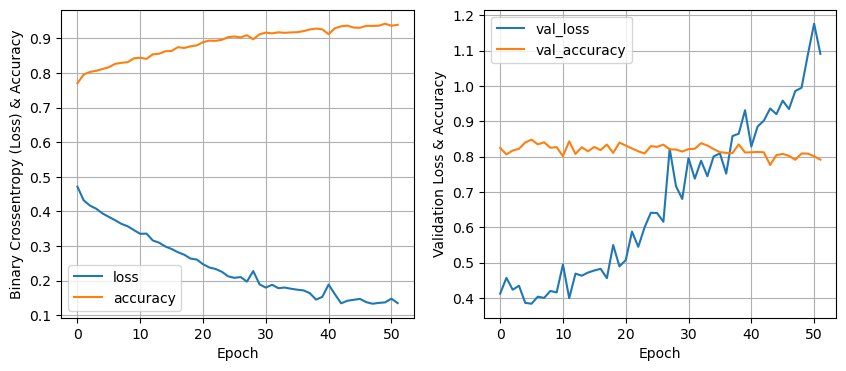

256 nodes, dropout 0, learning rate 0.01, batch size 64



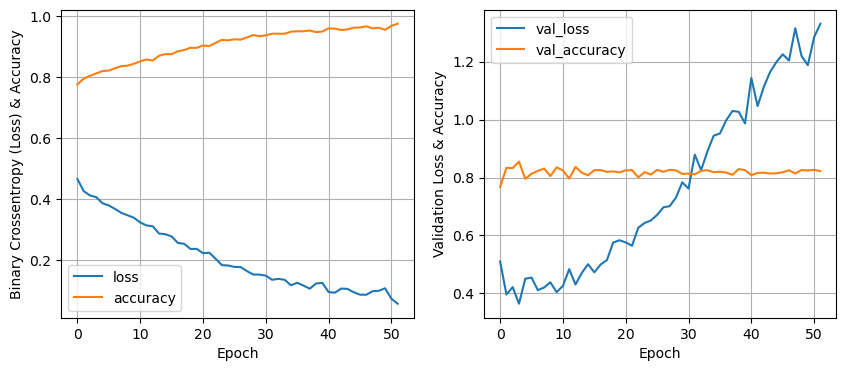

256 nodes, dropout 0, learning rate 0.01, batch size 128



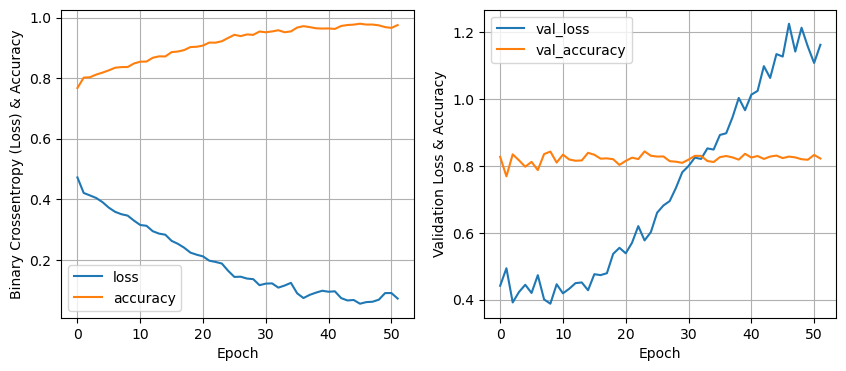

256 nodes, dropout 0, learning rate 0.01, batch size 256



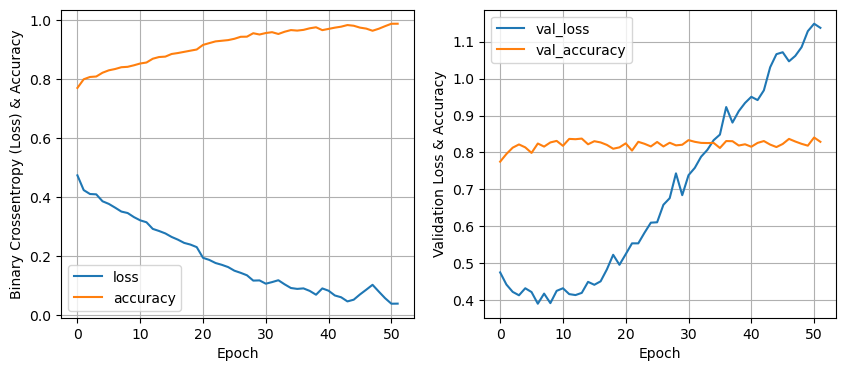

256 nodes, dropout 0, learning rate 0.005, batch size 16



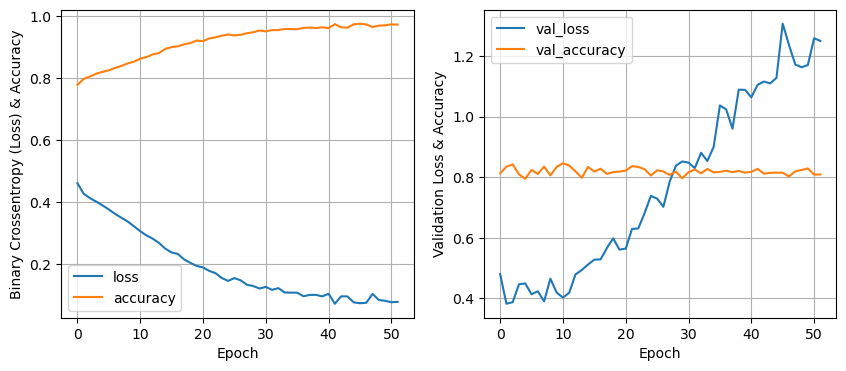

256 nodes, dropout 0, learning rate 0.005, batch size 32



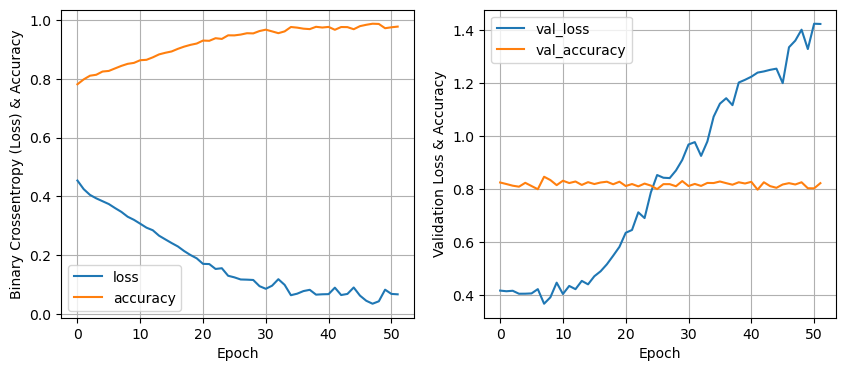

256 nodes, dropout 0, learning rate 0.005, batch size 64



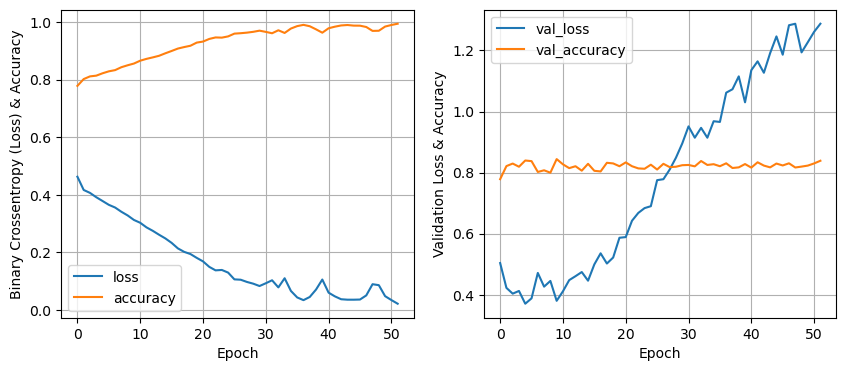

256 nodes, dropout 0, learning rate 0.005, batch size 128



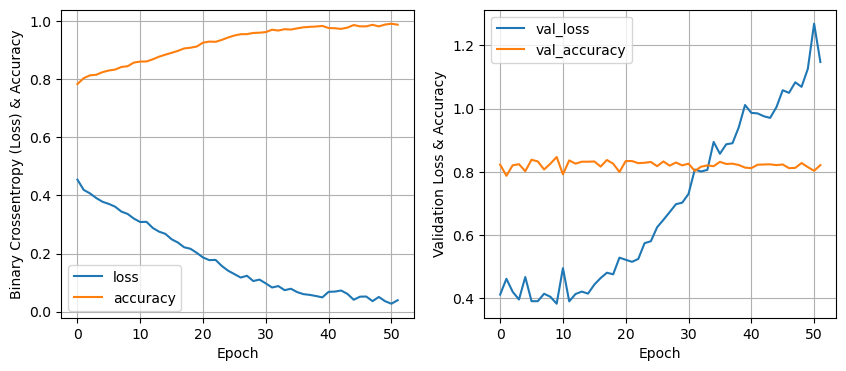

256 nodes, dropout 0, learning rate 0.005, batch size 256



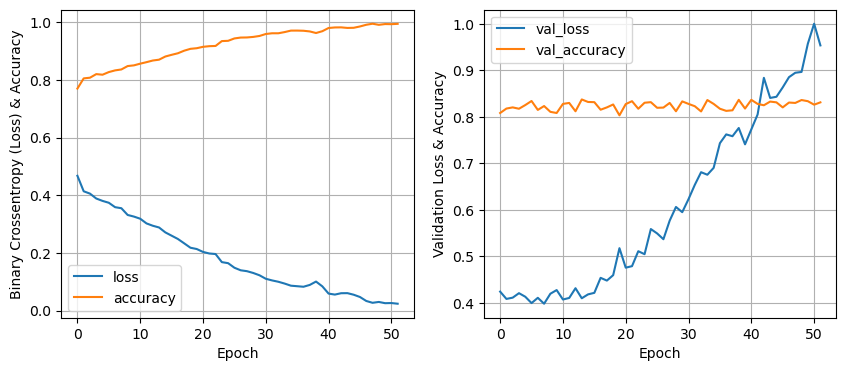

256 nodes, dropout 0, learning rate 0.0001, batch size 16



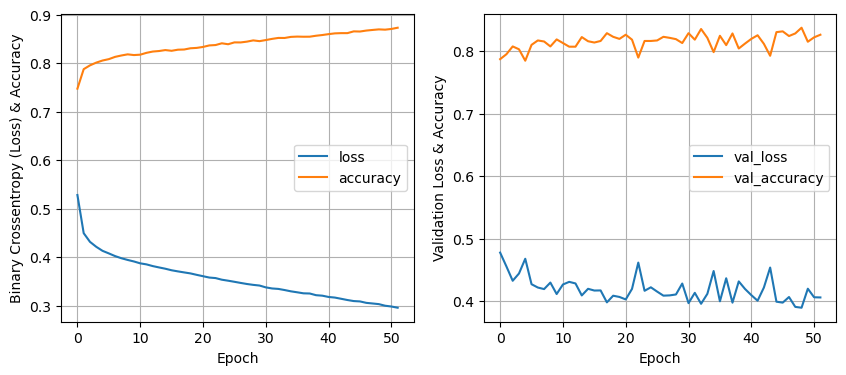

256 nodes, dropout 0, learning rate 0.0001, batch size 32



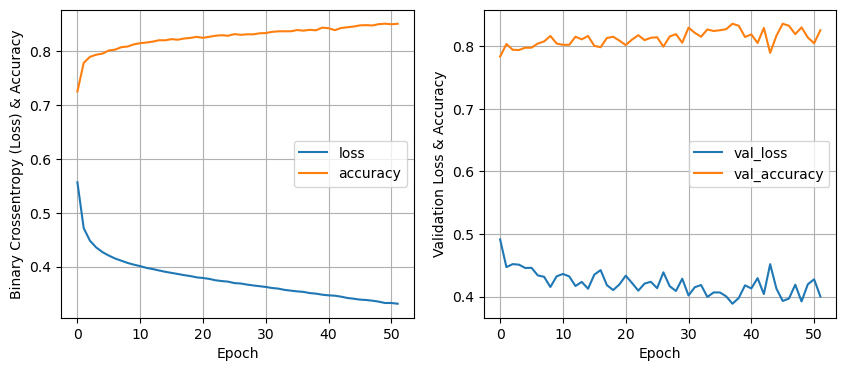

256 nodes, dropout 0, learning rate 0.0001, batch size 64



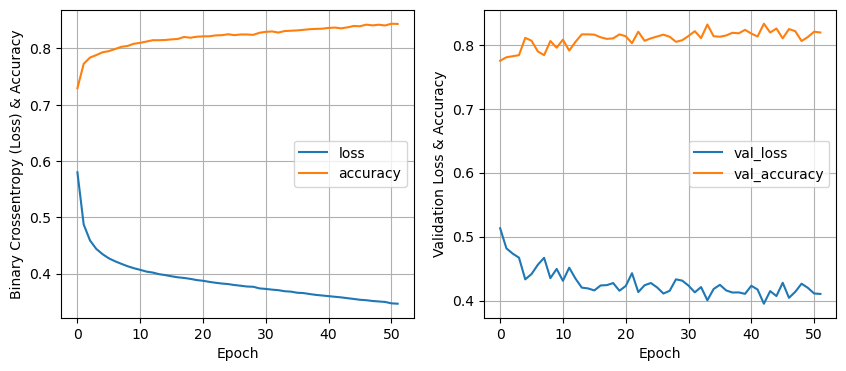

256 nodes, dropout 0, learning rate 0.0001, batch size 128



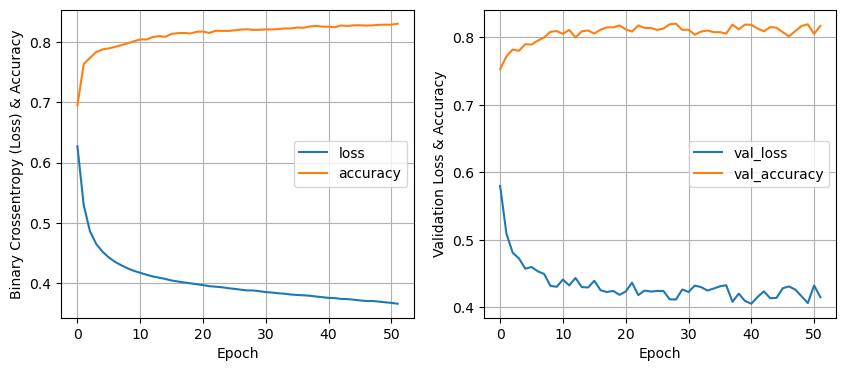

256 nodes, dropout 0, learning rate 0.0001, batch size 256



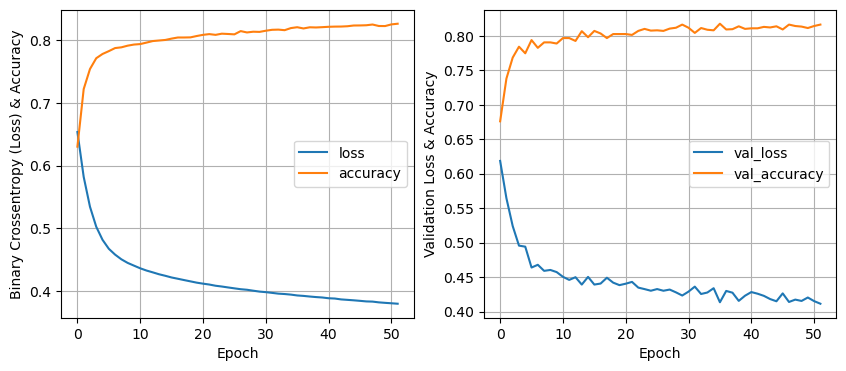

256 nodes, dropout 0.2, learning rate 0.01, batch size 16



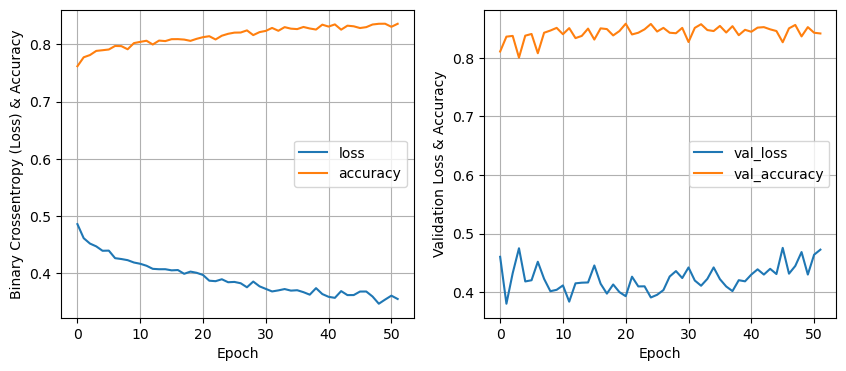

256 nodes, dropout 0.2, learning rate 0.01, batch size 32



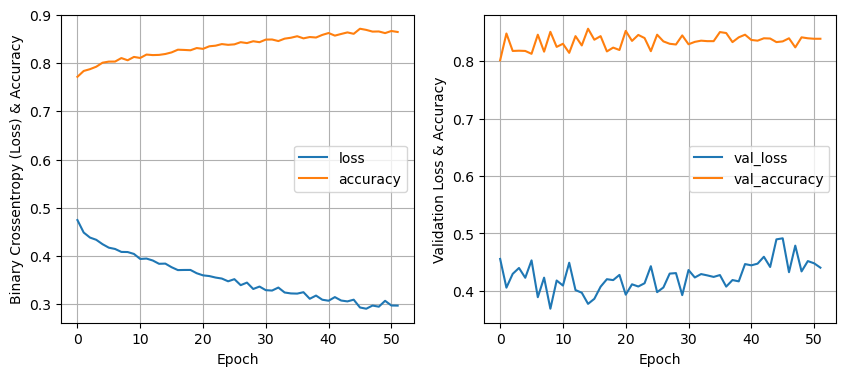

256 nodes, dropout 0.2, learning rate 0.01, batch size 64



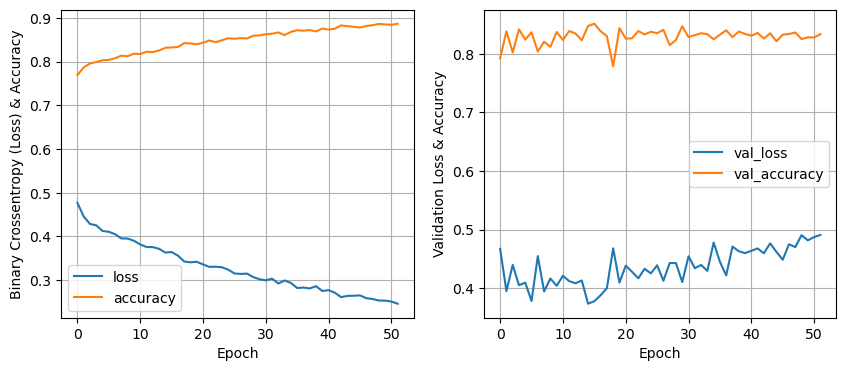

256 nodes, dropout 0.2, learning rate 0.01, batch size 128



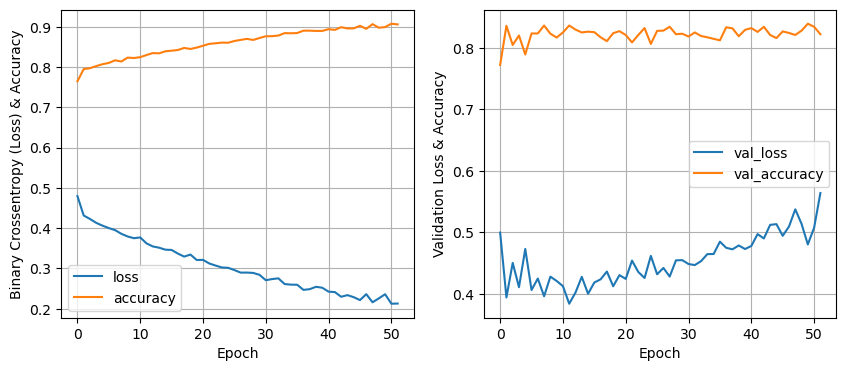

256 nodes, dropout 0.2, learning rate 0.01, batch size 256



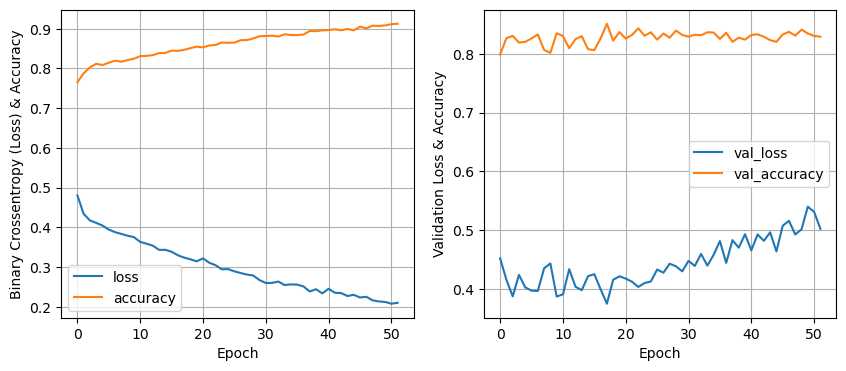

256 nodes, dropout 0.2, learning rate 0.005, batch size 16



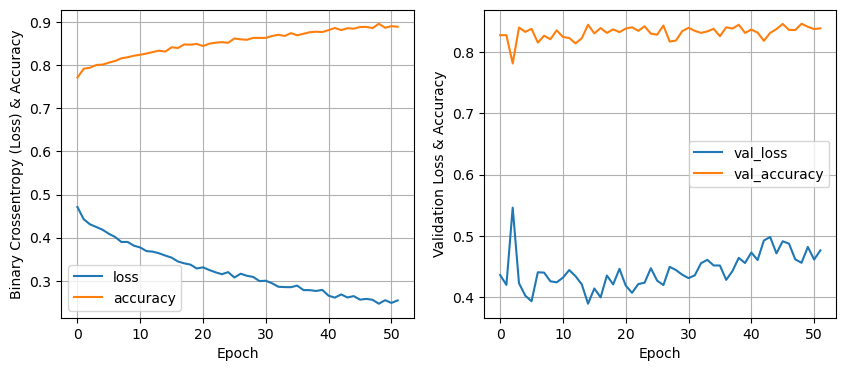

256 nodes, dropout 0.2, learning rate 0.005, batch size 32



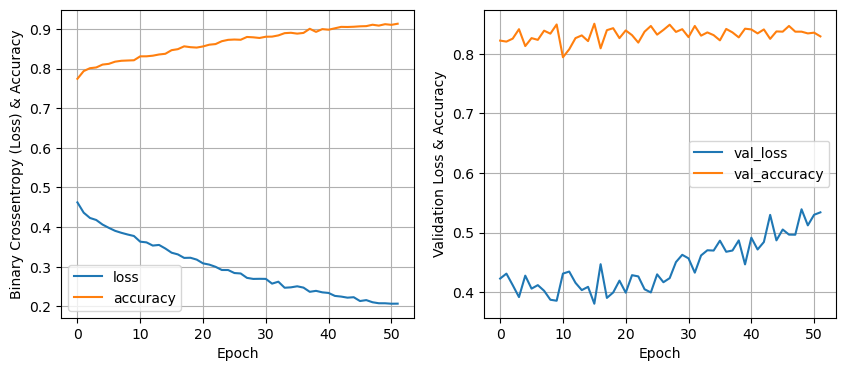

256 nodes, dropout 0.2, learning rate 0.005, batch size 64



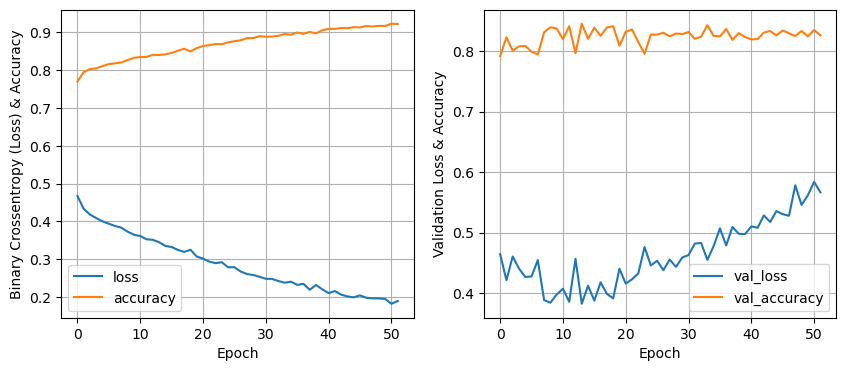

256 nodes, dropout 0.2, learning rate 0.005, batch size 128



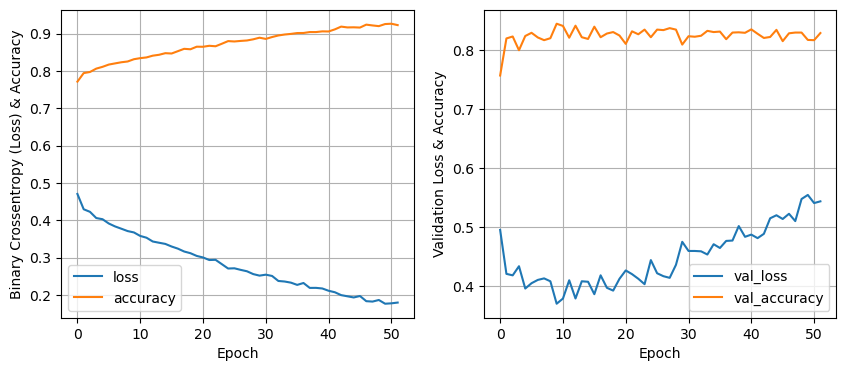

256 nodes, dropout 0.2, learning rate 0.005, batch size 256



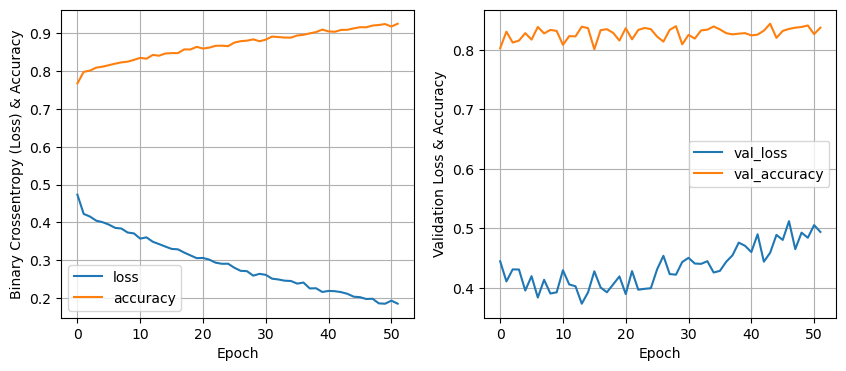

256 nodes, dropout 0.2, learning rate 0.0001, batch size 16



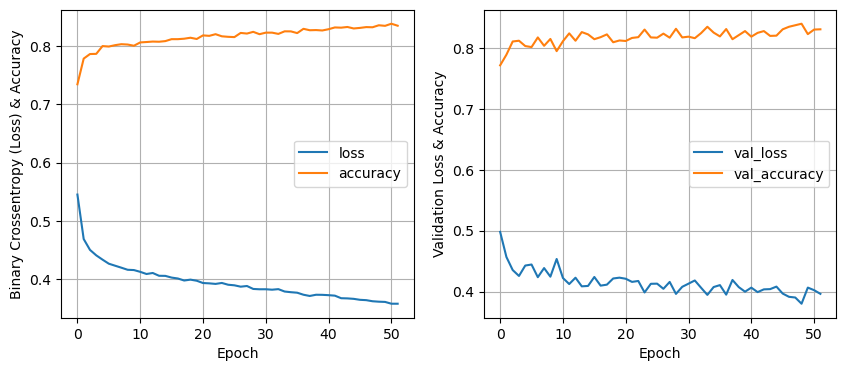

256 nodes, dropout 0.2, learning rate 0.0001, batch size 32



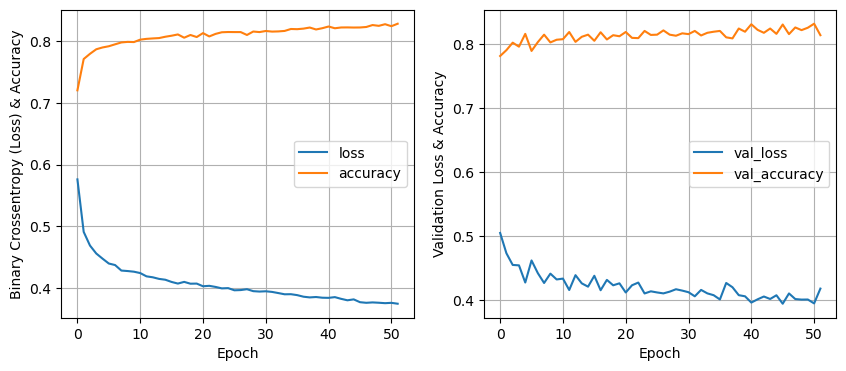

256 nodes, dropout 0.2, learning rate 0.0001, batch size 64



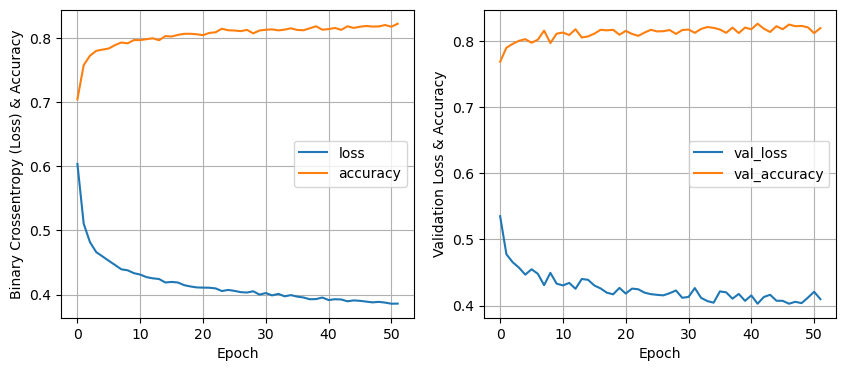

256 nodes, dropout 0.2, learning rate 0.0001, batch size 128



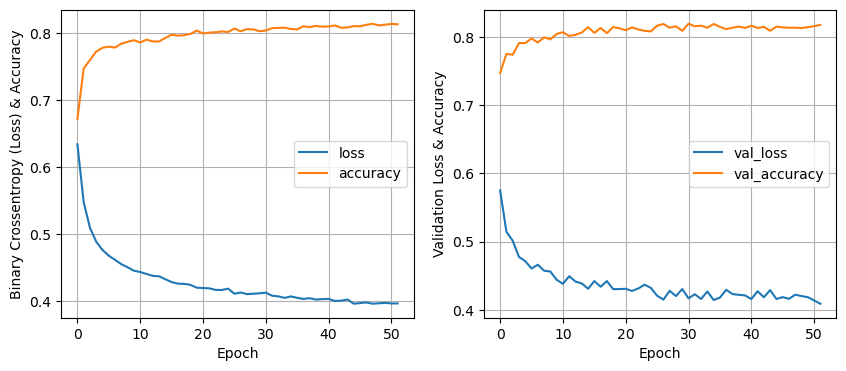

256 nodes, dropout 0.2, learning rate 0.0001, batch size 256



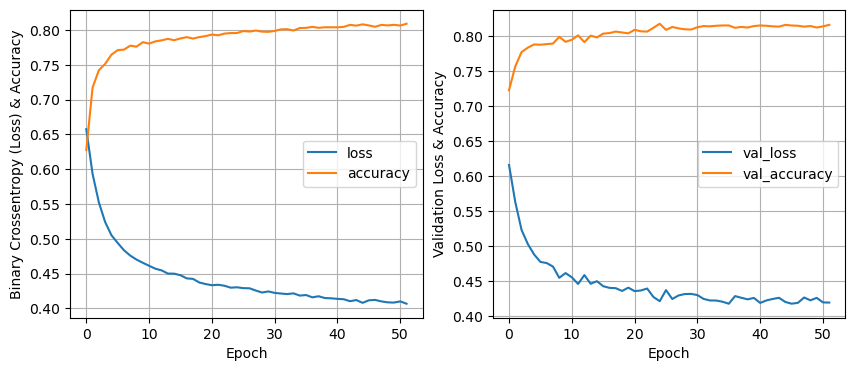

Least validation loss:  0.3719850182533264


In [21]:
least_val_loss = float('inf')
least_loss_model = None
epochs = 52
for num_nodes in [16, 32, 64, 128, 256]:
    for dropout_prob in [0, 0.2]:
        for lr in [0.01, 0.005, 0.0001]:
            for batch_size in [16, 32, 64, 128, 256]:
                print(f"{num_nodes} nodes, dropout {dropout_prob}, learning rate {lr}, batch size {batch_size}\n")
                model, history = train_model(x_train, y_train, num_nodes, dropout_prob, lr, batch_size, epochs, valid=(x_valid, y_valid))
                plot_history(history)
                val_loss = model.evaluate(x_valid, y_valid, verbose=0)[0]
                if val_loss < least_val_loss:
                    least_val_loss = val_loss
                    least_loss_model = model
print("Least validation loss: ", least_val_loss)

## Model Report

In [42]:
# Initialize models
models = {
    'KNN': KNeighborsClassifier(n_neighbors = 5),
    'Logistic Regression': LogisticRegression(),
    'Naive Bayes': GaussianNB(),
    'SVM': SVC(probability=True),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_estimators = 100, random_state=42),
    'Gradient Boost': GradientBoostingClassifier(n_estimators = 100, random_state=42),
    'ADA Boost': AdaBoostClassifier(n_estimators = 100, random_state=42)
}

results = []
k_folds = 3
for name, model in models.items():
    # Train model
    model.fit(x_train, y_train)
    
    # Make predictions
    y_pred = model.predict(x_test)
    y_pred_proba = model.predict_proba(x_test)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    loss = log_loss(y_test, y_pred_proba)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # K-Fold Cross Validation on training data
    cv_scores = cross_val_score(model, x_train, y_train, cv=k_folds)
    test_accuracy = accuracy_score(y_test, y_pred)

     # Determine if overfitting, underfitting, or balanced
    if train_accuracy_manual > val_accuracy + 0.1:
        fit_status = 'Overfitting'
        # K-Fold Cross Validation on training data
        cv_scores = cross_val_score(model, x_train, y_train, cv=k_folds)
        test_accuracy = accuracy_score(y_test, y_pred)
    elif val_accuracy > train_accuracy_manual + 0.1:
        fit_status = 'Underfitting'
    else:
        fit_status = 'Balanced'
    
    # Store results
    results.append({
        'Model': name,
        'Accuracy': accuracy*100,
        'Loss': loss,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1,
        "Mean Accuracy": cv_scores.mean()*100,
        "Test Model Accuracy": test_accuracy*100,
        "Fit Status": fit_status
        
    })


# Create DataFrame and display results
results_df = pd.DataFrame(results)
report = results_df.set_index('Model')
report = report.sort_values(by='Mean Accuracy', ascending = False)
initial_report = result_df.sort_values(by='Accuracy', ascending = False)

print(f"Initial Model Comparision Report (Training Data)\n")
initial_report

Initial Model Comparision Report (Training Data)



,Model,Accuracy,Training Accuracy,Validation Accuracy,Fit Status,Best Parameters (GridSearchCV),Best Cross-Validation Score
5,Random Forest,0.854227,1.000000,0.843815,Overfitting,"{'max_depth': None, 'n_estimators': 200}",0.939657
3,SVM,0.833403,0.836305,0.827155,Balanced,N/A,N/A
6,Gradient Boost,0.830904,0.846101,0.820075,Balanced,N/A,N/A
4,Decision Tree,0.780092,1.000000,0.790504,Overfitting,"{'max_depth': None, 'min_samples_split': 2}",0.903803
0,KNN,0.768846,0.889596,0.768846,Overfitting,{'n_neighbors': 3},0.834838
1,Logistic Regression,0.755935,0.755094,0.767180,Balanced,N/A,N/A
7,ADA Boost,0.740525,0.760678,0.739692,Balanced,N/A,N/A
2,Naive Bayes,0.688880,0.699647,0.705123,Balanced,N/A,N/A


In [43]:
print(f"Final Model Comparision Report\n")
report

Final Model Comparision Report



,Accuracy,Loss,Precision,Recall,F1-score,Mean Accuracy,Test Model Accuracy,Fit Status
Model,,,,,,,,
Random Forest,85.422741,0.357922,0.850749,0.854227,0.850843,93.044799,85.422741,Balanced
Decision Tree,79.092045,7.535991,0.787222,0.790920,0.788751,88.754119,79.092045,Balanced
Gradient Boost,83.090379,0.402492,0.837141,0.830904,0.833225,82.699848,83.090379,Balanced
SVM,83.340275,0.403437,0.836392,0.833403,0.834670,81.906335,83.340275,Balanced
KNN,76.884631,2.542052,0.774650,0.768846,0.771330,80.593751,76.884631,Balanced
ADA Boost,74.052478,0.604622,0.781559,0.740525,0.750711,75.705299,74.052478,Balanced
Logistic Regression,75.593503,0.530602,0.778645,0.755935,0.763064,75.382063,75.593503,Balanced
Naive Bayes,68.887963,0.624459,0.743979,0.688880,0.702261,69.808034,68.887963,Balanced
